In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline 
from statsmodels.tsa.exponential_smoothing.ets import ETSModel
from sklearn.ensemble import RandomForestClassifier
from math import sqrt
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings('ignore')

In [2]:
#take the dataframe and only present the relevant category
def filter_aggregate_sales(frame, column_to_filter, column_value_to_filter, column_to_aggregate):
    frame = frame[frame[column_to_filter] == column_value_to_filter]
    frame = frame.groupby(column_to_aggregate).sum().T
    return frame

In [3]:
#ETSmodel prediction feature
def ETS_predict(frame, column_to_predict, days_to_predict):
    modelETS = ETSModel(frame.set_index('date')[column_to_predict].iloc[:-days_to_predict]/100, error="add", trend="add", seasonal="add",
                damped_trend=False, seasonal_periods=7)
    fit = modelETS.fit()
    prediction = fit.predict(start= frame.date.min(), end= frame.date.max())
    frame = frame.assign(ETS=prediction.values*100).set_index('date')
    return frame

In [4]:
#Create training/test dataset
def train_test_set(frame, target_feature, start_date, end_date):
    splittedframe = frame[start_date:end_date]
    input_train = splittedframe.drop(target_feature, axis='columns')
    target_train = splittedframe[target_feature]
    return input_train, target_train

In [5]:
#Model and predict data using Random Forest 
def forest(X_train, y_train, X_test):
    model = RandomForestClassifier()
    model.fit(X_train, y_train)
    y_predicted = model.predict(X_test)
    return y_predicted 

In [6]:
#Function to create train/test split and do model and prediction
def split_n_model(frame, target_feature, train_start_date, train_end_date,
                 test_start_date, test_end_date):
    
    X_train, y_train = train_test_set(frame=frame, target_feature = target_feature,
                                      start_date=train_start_date, end_date=train_end_date)
    
    X_test, y_test   = train_test_set(frame=frame, target_feature = target_feature,
                                      start_date=test_start_date, end_date=test_end_date)
    
    y_predicted      = forest(X_train, y_train, X_test)
    
    return y_test, y_predicted

In [7]:
#Cal_features is the features taken from 003-EK-model from cleanmergedframe
sales = pd.read_csv('/Users/user/hts-forecast/volume/data/raw/sales_train_evaluation.csv')
cal_features = pd.read_csv('/Users/user/hts-forecast/volume/data/processed/sales_cal_features.csv')
cal_features.drop('Unnamed: 0', axis='columns', inplace=True)
sales.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES_1_003_CA_1_evaluation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES_1_004_CA_1_evaluation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES_1_005_CA_1_evaluation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0


In [8]:
cal_features.head()

,date,wday,month,event_type_1,week_of_year
0,2011-01-29,1,1,0,4
1,2011-01-30,2,1,0,4
2,2011-01-31,3,1,0,5
3,2011-02-01,4,2,0,5
4,2011-02-02,5,2,0,5


In [200]:
#Takes the top of hierarchical chain (e.g. FOODS) and outputs the actual 
#-sales per day and the predicted sales (for testing in top-down HTS)

def top_of_hierarchy(column_to_filter, column_value_to_filter):
    featureframe = cal_features.copy()
    featureframe.date = pd.to_datetime(featureframe.date)

    featureframe[column_value_to_filter] = filter_aggregate_sales(frame=sales, column_to_filter=column_to_filter,
                                                                  column_value_to_filter=column_value_to_filter,
                                                                  column_to_aggregate=column_to_filter)[column_value_to_filter].values
    
    featureframe['ETS'] = ETS_predict(frame=featureframe, column_to_predict=column_value_to_filter, 
                                      days_to_predict=120)['ETS'].values

    featureframe.set_index('date', inplace=True)

    featureframe_y_test, featureframe_y_predicted = split_n_model(frame=featureframe, target_feature=column_value_to_filter,
                                                    train_start_date='2011-01-29', train_end_date='2016-01-22', 
                                                    test_start_date='2016-01-24', test_end_date='2016-05-22')
    
    top_of_chain_sales = featureframe[column_value_to_filter].values
    prediction_for_top_of_chain_sales = featureframe_y_predicted 
    
    return top_of_chain_sales, prediction_for_top_of_chain_sales


In [218]:
#Takes the sub category and returns the actual sales, Random forest AND top down prediction plots for the 
#prediction period of days
def topdown_compare_visual(column_to_filter, column_value_to_filter, top_of_chain_sales, prediction_for_top_of_chain_sales):
    featureframe = cal_features.copy()
    featureframe.date = pd.to_datetime(featureframe.date)

    featureframe[column_value_to_filter] = filter_aggregate_sales(frame=sales, column_to_filter=column_to_filter,
                                                                  column_value_to_filter=column_value_to_filter,
                                                                  column_to_aggregate=column_to_filter)[column_value_to_filter].values
    
    featureframe['ETS'] = ETS_predict(frame=featureframe, column_to_predict=column_value_to_filter, 
                                      days_to_predict=120)['ETS'].values

    featureframe.set_index('date', inplace=True)

    featureframe_y_test, featureframe_y_predicted = split_n_model(frame=featureframe, target_feature=column_value_to_filter,
                                                    train_start_date='2011-01-29', train_end_date='2016-01-22', 
                                                    test_start_date='2016-01-24', test_end_date='2016-05-22')

    print("Average sales for foods items is: ", featureframe_y_test.mean())
    rmse = sqrt(mean_squared_error(featureframe_y_test, featureframe_y_predicted))
    print("Root mean squared error is: ", rmse)
    
    sales_fraction = featureframe[column_value_to_filter][:-120].sum()/top_of_chain_sales[:-120].sum()
    
    print("sales fraction is: ", sales_fraction)
    rmse2 = sqrt(mean_squared_error(featureframe_y_test, prediction_for_top_of_chain_sales*(sales_fraction)))
    print("(top down) Root mean squared error is: ", rmse2)
    print("RMSE ratio between (top-down)HTS:(Random Forest)TS = ", rmse2/rmse)
    
    
    plt.figure(figsize=(15,6))
    plt.plot(featureframe_y_test,'k-.', label='Actual')
    plt.plot(featureframe_y_test.index, featureframe_y_predicted,'b-.', label='Random Forest prediction')
    plt.plot(featureframe_y_test.index, prediction_for_top_of_chain_sales*(sales_fraction),'r-.', label='Top-Down prediction')
    plt.xlim('2016-01-22', '2016-05-22')
    plt.legend()
    plt.show()
    return 


In [202]:
#Takes the sub category and returns the ratio of RMSE between top-down and direct random forest, where 
# ratio < 1 means top-down outperforms direct random forest, and vice versa 
def topdown_compare_ratio(column_to_filter, column_value_to_filter, top_of_chain_sales, prediction_for_top_of_chain_sales):
    featureframe = cal_features.copy()
    featureframe.date = pd.to_datetime(featureframe.date)

    featureframe[column_value_to_filter] = filter_aggregate_sales(frame=sales, column_to_filter=column_to_filter,
                                                                  column_value_to_filter=column_value_to_filter,
                                                                  column_to_aggregate=column_to_filter)[column_value_to_filter].values
    
    featureframe['ETS'] = ETS_predict(frame=featureframe, column_to_predict=column_value_to_filter, 
                                      days_to_predict=120)['ETS'].values

    featureframe.set_index('date', inplace=True)

    featureframe_y_test, featureframe_y_predicted = split_n_model(frame=featureframe, target_feature=column_value_to_filter,
                                                    train_start_date='2011-01-29', train_end_date='2016-01-22', 
                                                    test_start_date='2016-01-24', test_end_date='2016-05-22')

    rmse = sqrt(mean_squared_error(featureframe_y_test, featureframe_y_predicted))
    sales_fraction = featureframe[column_value_to_filter][:-120].sum()/top_of_chain_sales[:-120].sum()
    rmse2 = sqrt(mean_squared_error(featureframe_y_test, prediction_for_top_of_chain_sales*(sales_fraction)))
    RMSE_ratio = rmse2/rmse
    # If RMSE_ratio < 1, then top_down HTS out-performs direct random forest modelling 

    return RMSE_ratio 


## Comparing top-down method to direct Random Forest predictions for: 

# FOODS ----> FOODS_1, FOODS_2, FOODS_3 

In [203]:
FOODS_sales, prediction_for_FOODS = top_of_hierarchy(column_to_filter='cat_id',
                                                     column_value_to_filter='FOODS') 

FOODS_1
Average sales for foods items is:  3216.4416666666666
Root mean squared error is:  860.2218512298634
sales fraction is:  0.11297961362477947
(top down) Root mean squared error is:  659.1215987336861
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7662228037933897


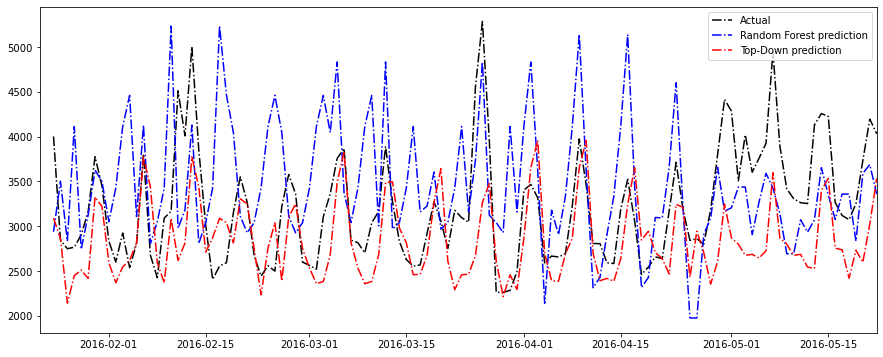

FOODS_2
Average sales for foods items is:  5733.533333333334
Root mean squared error is:  1293.7899430226944
sales fraction is:  0.16712632474401656
(top down) Root mean squared error is:  1724.3639136104796
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.332800523693847


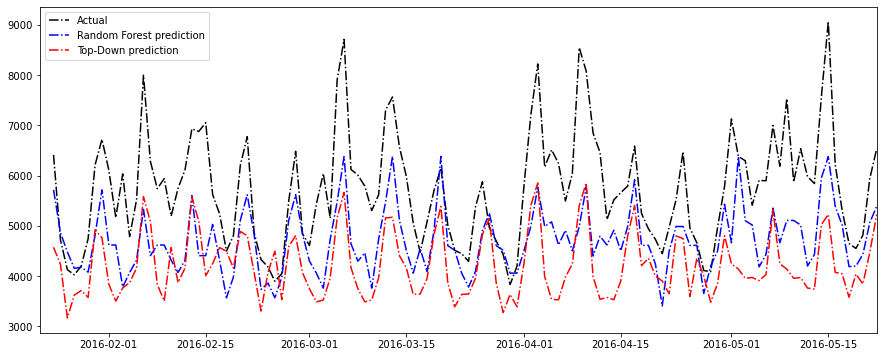

FOODS_3
Average sales for foods items is:  19364.208333333332
Root mean squared error is:  2652.8975416828043
sales fraction is:  0.719894061631204
(top down) Root mean squared error is:  2156.109918567728
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8127377272173314


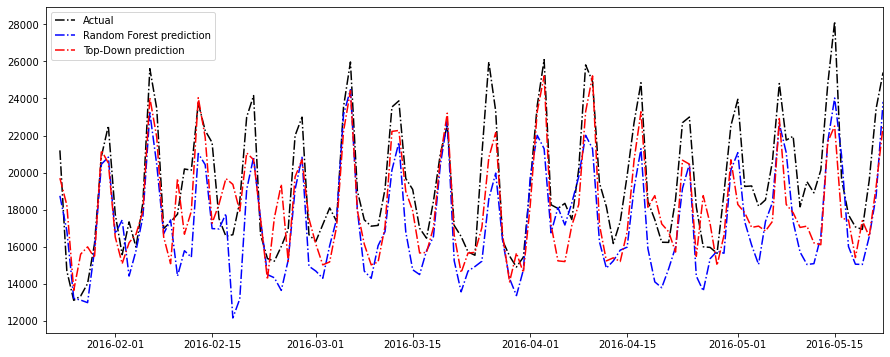

In [219]:
list_of_cats = ['FOODS_1', 'FOODS_2', 'FOODS_3']

for cat in list_of_cats:
    print(cat)
    topdown_compare_visual(column_to_filter='dept_id', column_value_to_filter=cat, 
                           top_of_chain_sales=FOODS_sales, 
                           prediction_for_top_of_chain_sales=prediction_for_FOODS)

In [206]:
# List of RMSE ratios, where ratio < 1 means top down is better 
for cat in list_of_cats:
    print(topdown_compare_ratio(column_to_filter='dept_id', column_value_to_filter=cat, 
                                top_of_chain_sales=FOODS_sales, 
                                prediction_for_top_of_chain_sales=prediction_for_FOODS))

0.7897780289764217
1.2877835595270557
0.8008036855350696


## Comparing top-down method to direct Random Forest predictions for: 

# FOODS ----> first 100 individual (granular) food items 

FOODS_1_001
Average sales for foods items is:  5.725
Root mean squared error is:  5.293077239816803
sales fraction is:  0.00027553382179426204
(top down) Root mean squared error is:  4.062058798980589
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7674285892569328


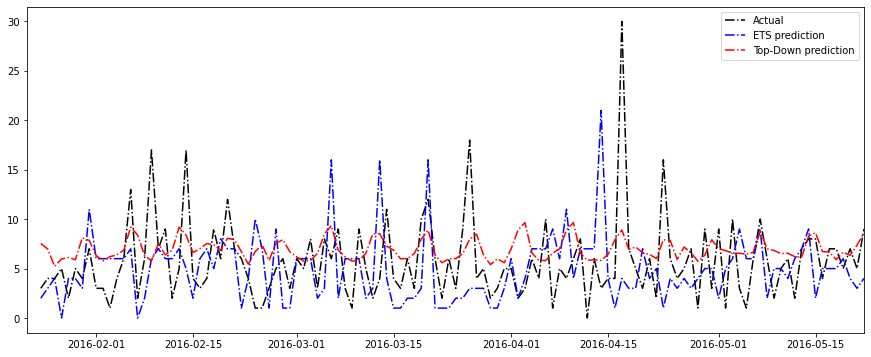

FOODS_1_002
Average sales for foods items is:  4.158333333333333
Root mean squared error is:  3.110466202999158
sales fraction is:  0.00016381058313722193
(top down) Root mean squared error is:  2.378435253418937
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7646555526388984


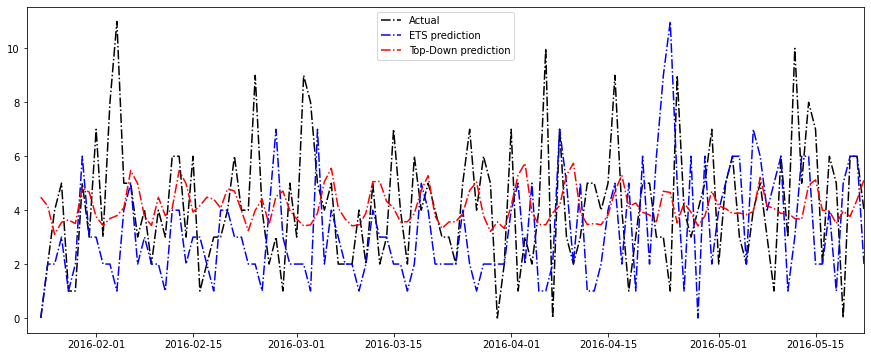

FOODS_1_003
Average sales for foods items is:  5.833333333333333
Root mean squared error is:  4.035261247222208
sales fraction is:  0.0003028355856504657
(top down) Root mean squared error is:  3.4702708496543035
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.859986661840833


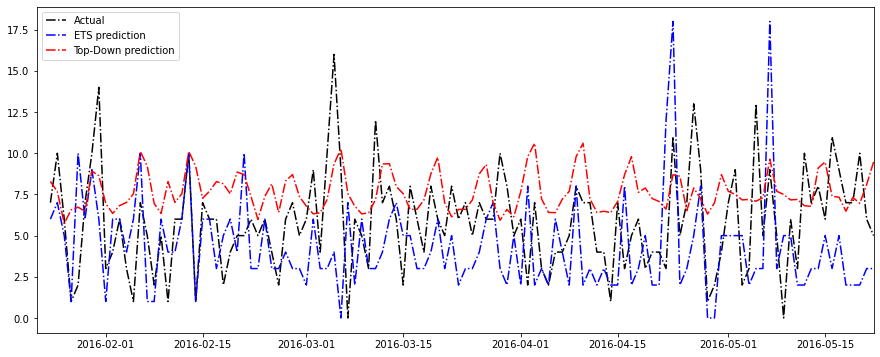

FOODS_1_004
Average sales for foods items is:  31.4
Root mean squared error is:  85.39896564557051
sales fraction is:  0.0030213716843553954
(top down) Root mean squared error is:  66.47202065288585
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7783703251016323


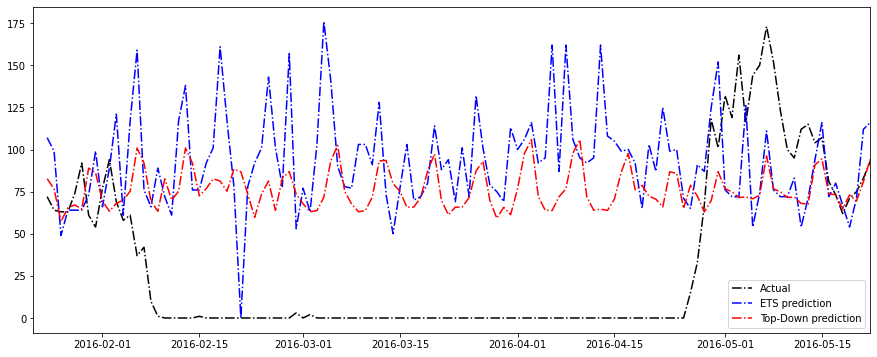

FOODS_1_005
Average sales for foods items is:  19.425
Root mean squared error is:  10.348912986396204
sales fraction is:  0.0004958997383287017
(top down) Root mean squared error is:  10.614464210380145
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0256598180246574


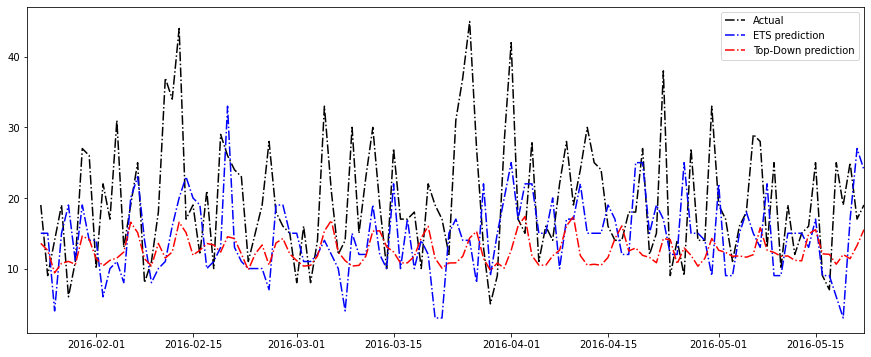

FOODS_1_006
Average sales for foods items is:  11.675
Root mean squared error is:  8.417244204607586
sales fraction is:  0.0004991919406886229
(top down) Root mean squared error is:  7.560199927216289
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8981799438678336


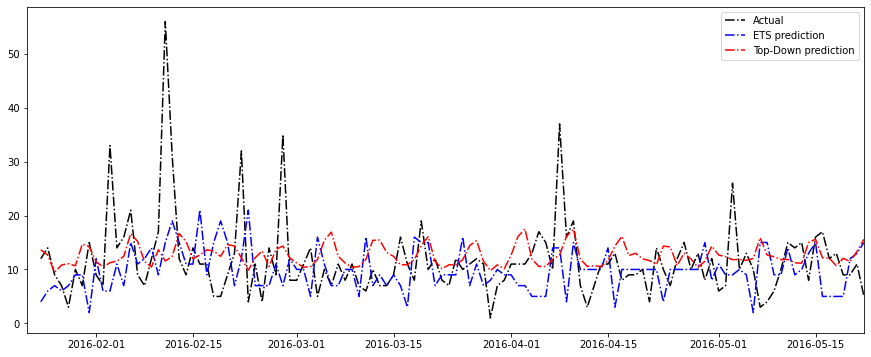

FOODS_1_008
Average sales for foods items is:  2.308333333333333
Root mean squared error is:  2.669269563007828
sales fraction is:  8.797235020332289e-05
(top down) Root mean squared error is:  1.973970972677928
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7395172821937052


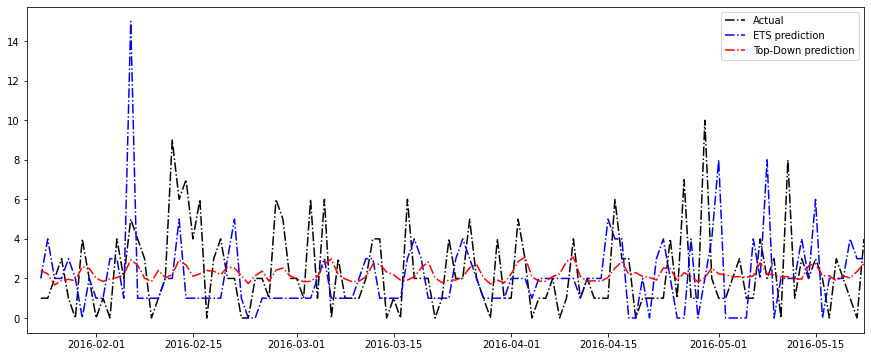

FOODS_1_009
Average sales for foods items is:  3.2416666666666667
Root mean squared error is:  7.012488859171186
sales fraction is:  0.00016538613712375566
(top down) Root mean squared error is:  5.342103631848951
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7617985196314936


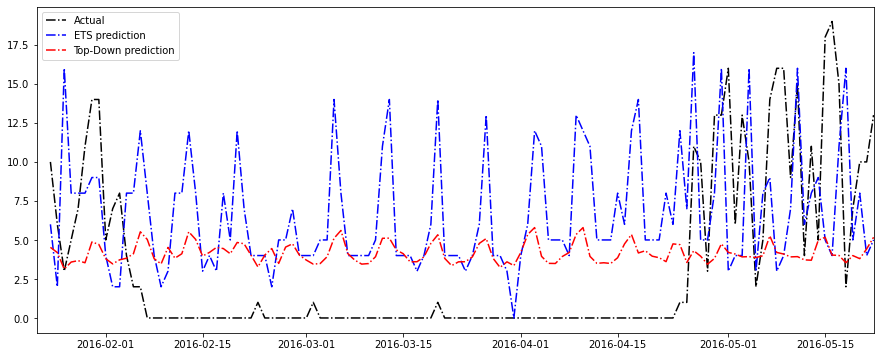

FOODS_1_010
Average sales for foods items is:  5.608333333333333
Root mean squared error is:  4.692192096096095
sales fraction is:  0.00013088855953800996
(top down) Root mean squared error is:  4.274695030525244
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9110230235632918


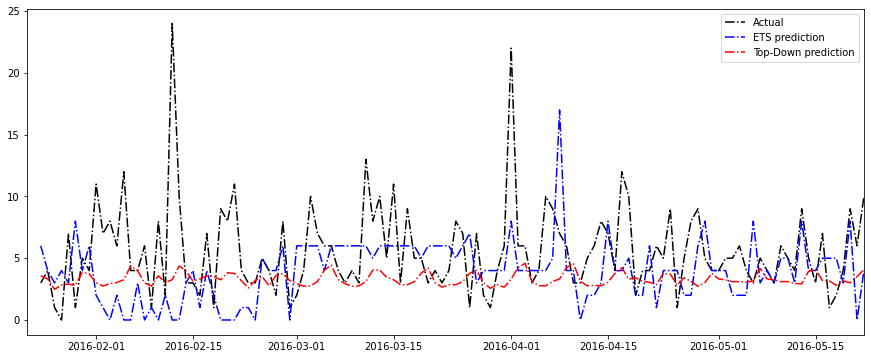

FOODS_1_011
Average sales for foods items is:  9.758333333333333
Root mean squared error is:  6.970174555442162
sales fraction is:  0.000216956135518807
(top down) Root mean squared error is:  6.152793447587826
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8827316157790995


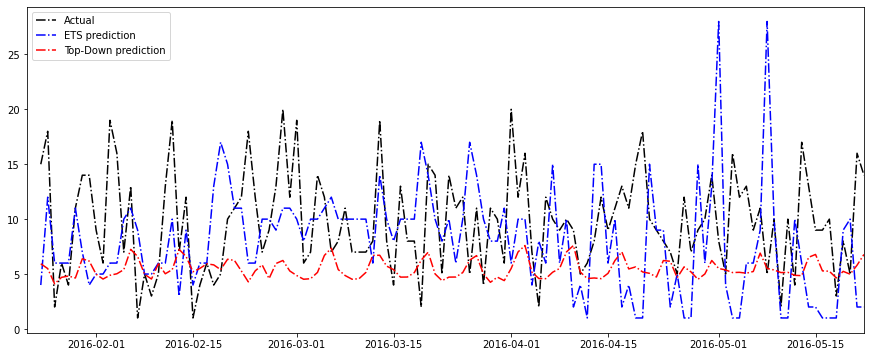

FOODS_1_012
Average sales for foods items is:  56.975
Root mean squared error is:  15.064306599818437
sales fraction is:  0.0018764612822305142
(top down) Root mean squared error is:  18.0150745026291
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1958781098392028


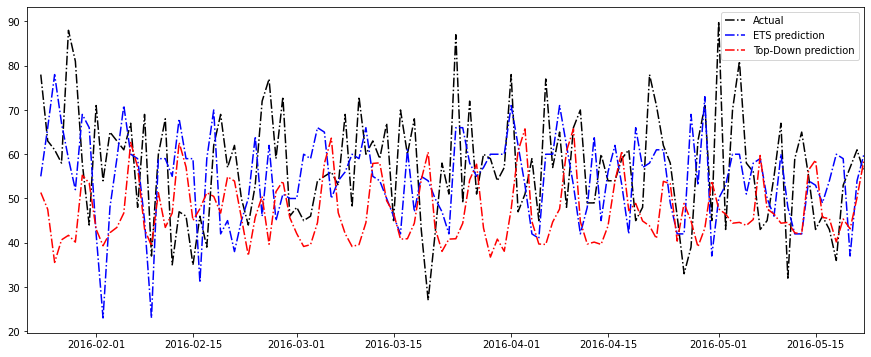

FOODS_1_013
Average sales for foods items is:  15.791666666666666
Root mean squared error is:  11.618232797346304
sales fraction is:  0.0005385572746208235
(top down) Root mean squared error is:  9.677557698951972
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8329629701655146


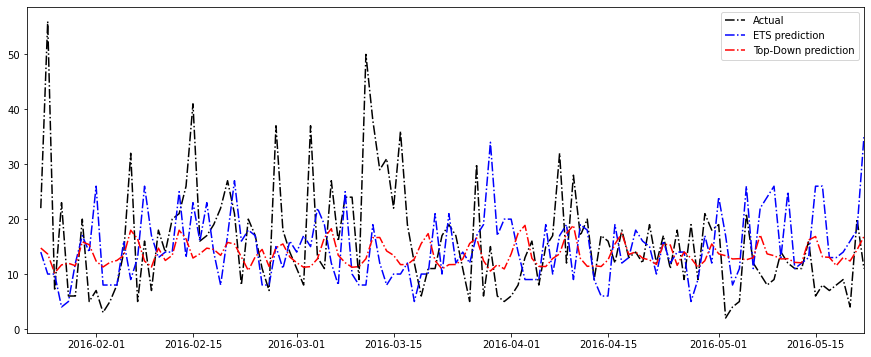

FOODS_1_014
Average sales for foods items is:  11.391666666666667
Root mean squared error is:  7.018428124112502
sales fraction is:  0.00029371148196725554
(top down) Root mean squared error is:  6.7532334244671155
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9622145165618661


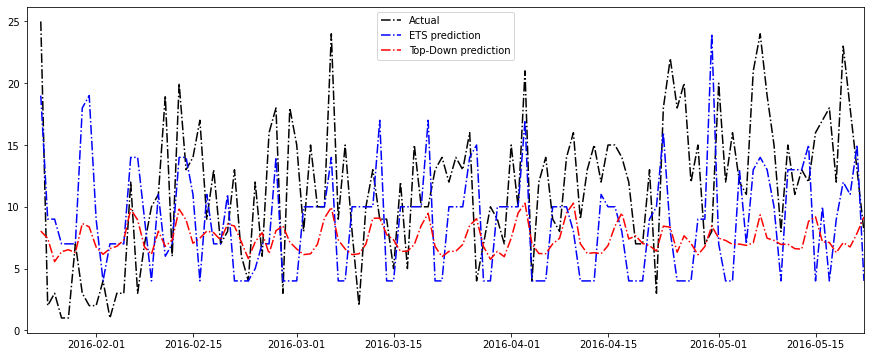

FOODS_1_015
Average sales for foods items is:  7.5
Root mean squared error is:  5.8594652770823155
sales fraction is:  0.000278567351111618
(top down) Root mean squared error is:  4.422955645040745
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7548394667240231


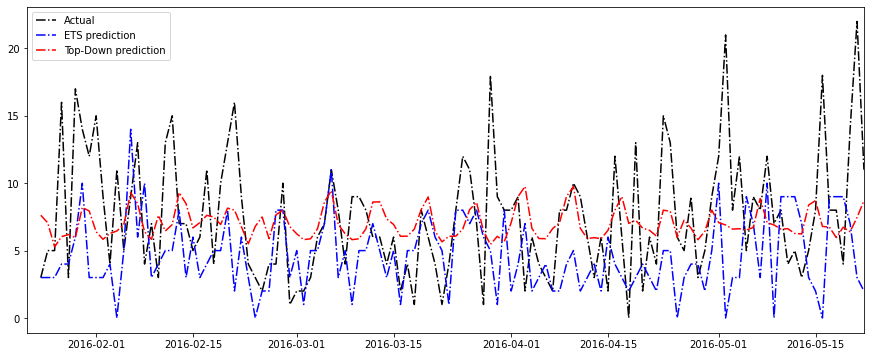

FOODS_1_016
Average sales for foods items is:  6.875
Root mean squared error is:  4.754822113742357
sales fraction is:  0.0003073741217609285
(top down) Root mean squared error is:  3.0668035818026524
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6449880791415932


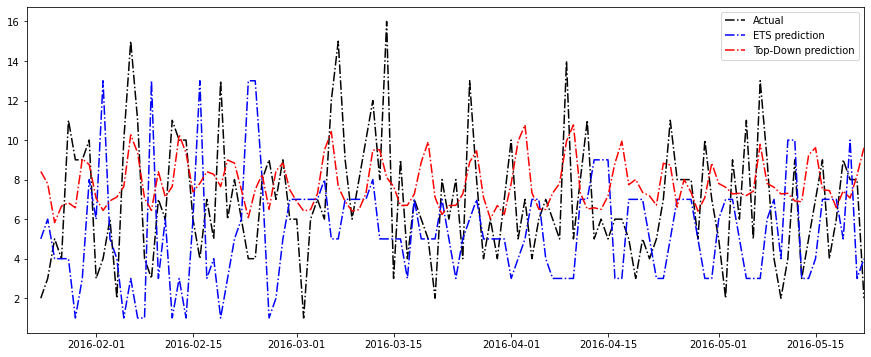

FOODS_1_017
Average sales for foods items is:  8.658333333333333
Root mean squared error is:  6.764490618910882
sales fraction is:  0.0001577670402336523
(top down) Root mean squared error is:  6.251043740155934
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9240967416941122


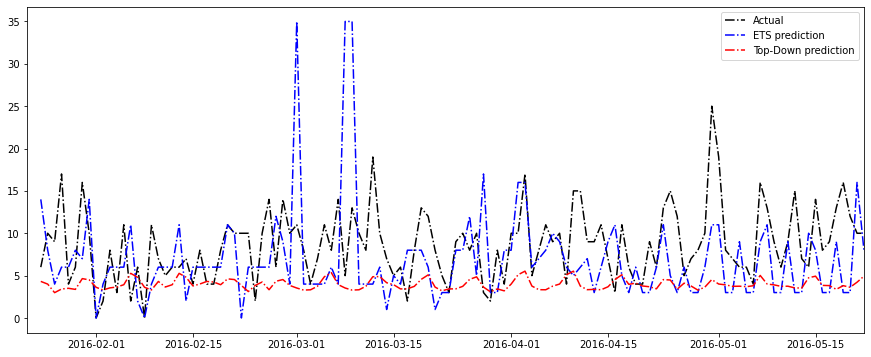

FOODS_1_018
Average sales for foods items is:  104.59166666666667
Root mean squared error is:  28.85740806101615
sales fraction is:  0.002909860087278636
(top down) Root mean squared error is:  40.255971034694596
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.3949960769025862


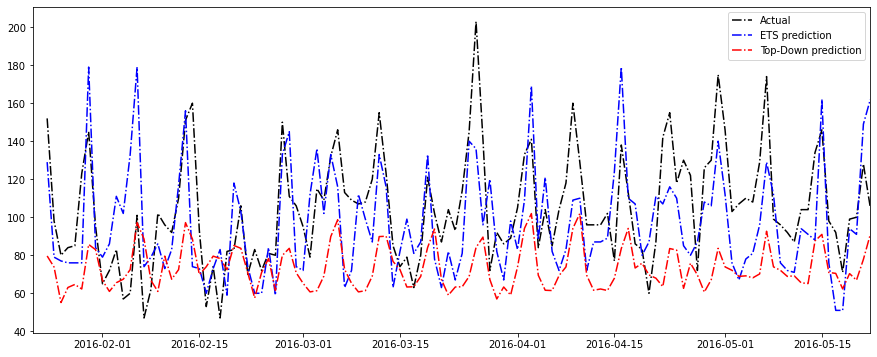

FOODS_1_019
Average sales for foods items is:  52.28333333333333
Root mean squared error is:  26.749922118266685
sales fraction is:  0.0013891212700376076
(top down) Root mean squared error is:  29.128832564215728
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0889314905453336


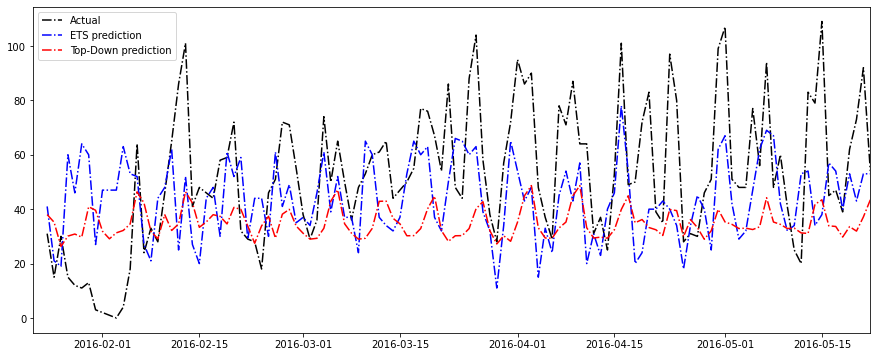

FOODS_1_020
Average sales for foods items is:  10.2
Root mean squared error is:  6.549809157525126
sales fraction is:  0.00037587544657843175
(top down) Root mean squared error is:  4.622456237285291
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7057390721032711


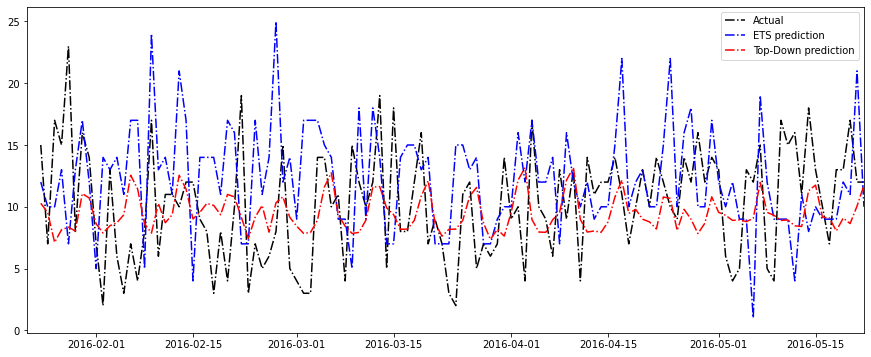

FOODS_1_021
Average sales for foods items is:  12.541666666666666
Root mean squared error is:  10.261172772479112
sales fraction is:  0.0006229552336905177
(top down) Root mean squared error is:  7.247606666353118
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7063136765216056


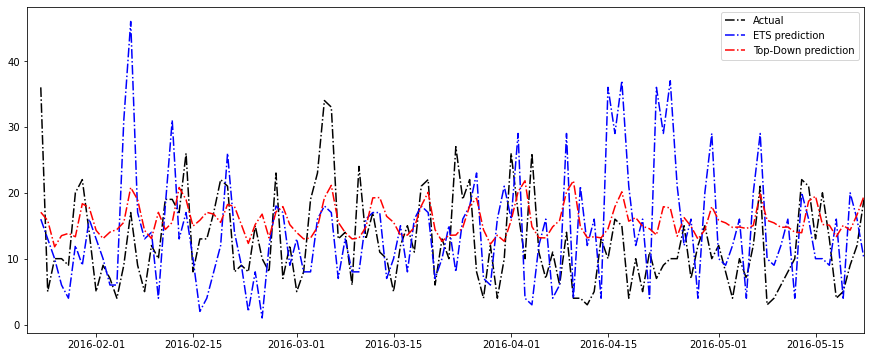

FOODS_1_022
Average sales for foods items is:  2.175
Root mean squared error is:  2.2211108331943574
sales fraction is:  6.631436182126986e-05
(top down) Root mean squared error is:  1.7818252949382276
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8022225943473708


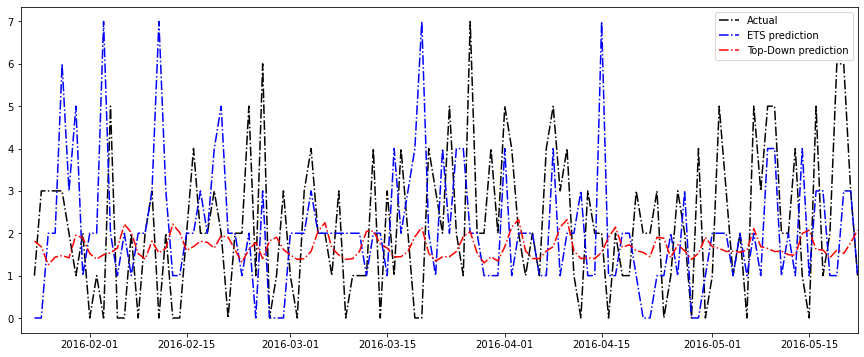

FOODS_1_023
Average sales for foods items is:  24.758333333333333
Root mean squared error is:  9.846319109189992
sales fraction is:  0.0006630025238258449
(top down) Root mean squared error is:  11.473078437874474
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1652149712643538


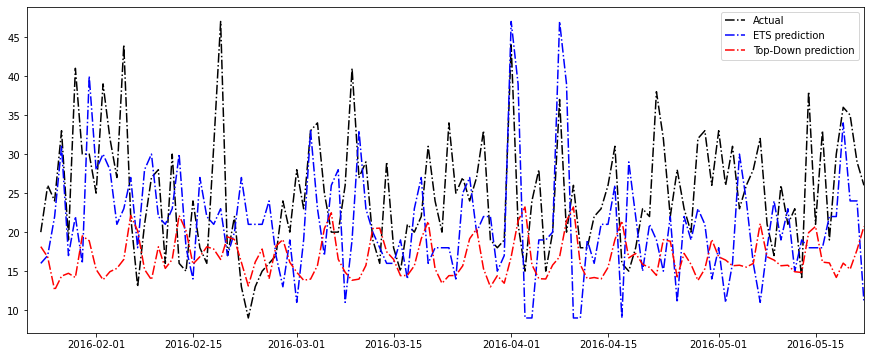

FOODS_1_024
Average sales for foods items is:  10.408333333333333
Root mean squared error is:  7.385797181076664
sales fraction is:  0.00047692254329687023
(top down) Root mean squared error is:  5.0912343733656416
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6893276715491214


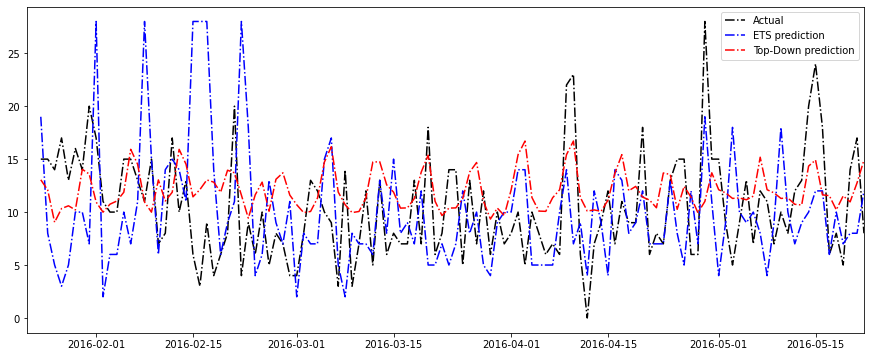

FOODS_1_025
Average sales for foods items is:  6.675
Root mean squared error is:  4.851975542669879
sales fraction is:  0.0002046338924002448
(top down) Root mean squared error is:  3.9332208807409255
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8106431794948015


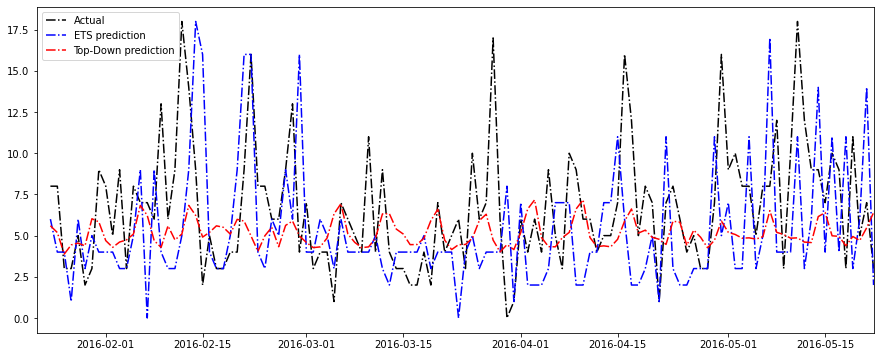

FOODS_1_026
Average sales for foods items is:  2.9833333333333334
Root mean squared error is:  5.090841449767088
sales fraction is:  0.00022057755811472033
(top down) Root mean squared error is:  4.965123683931382
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9753051107412788


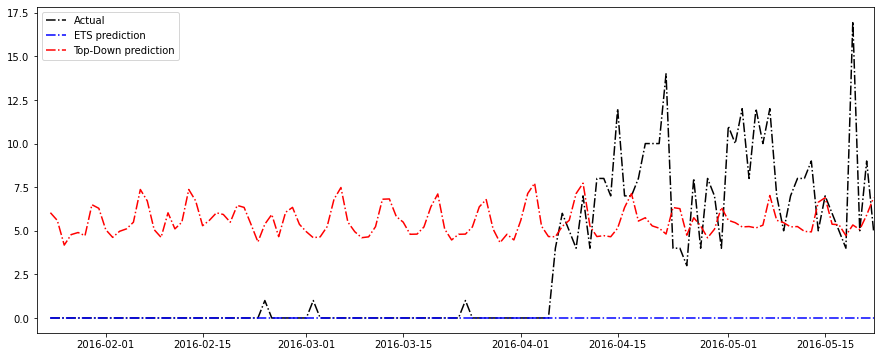

FOODS_1_027
Average sales for foods items is:  23.583333333333332
Root mean squared error is:  10.975351171298954
sales fraction is:  0.0008088470883703539
(top down) Root mean squared error is:  8.762923602683994
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7984185167213091


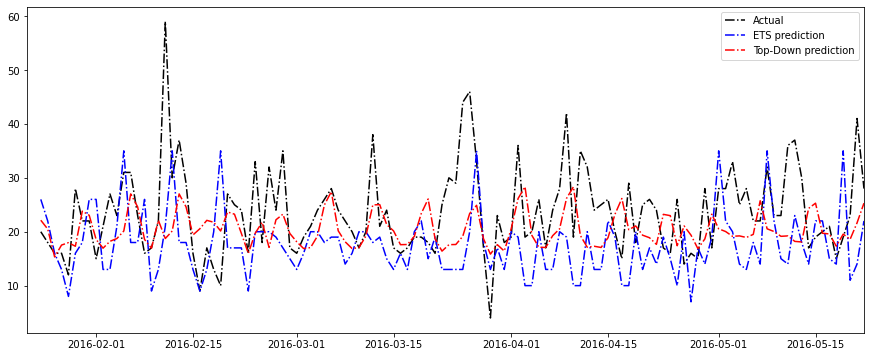

FOODS_1_028
Average sales for foods items is:  11.891666666666667
Root mean squared error is:  9.162423260251623
sales fraction is:  0.0003097962420685848
(top down) Root mean squared error is:  6.453616923813202
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7043569960154809


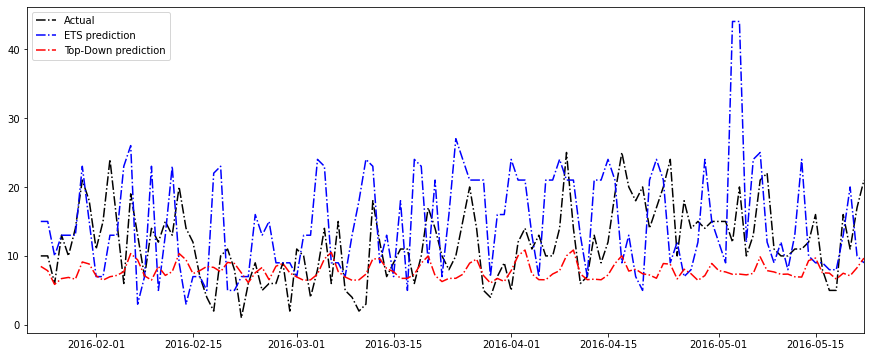

FOODS_1_029
Average sales for foods items is:  2.9916666666666667
Root mean squared error is:  2.583602136552763
sales fraction is:  0.00010187014730841881
(top down) Root mean squared error is:  2.1481907713629647
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8314712009912033


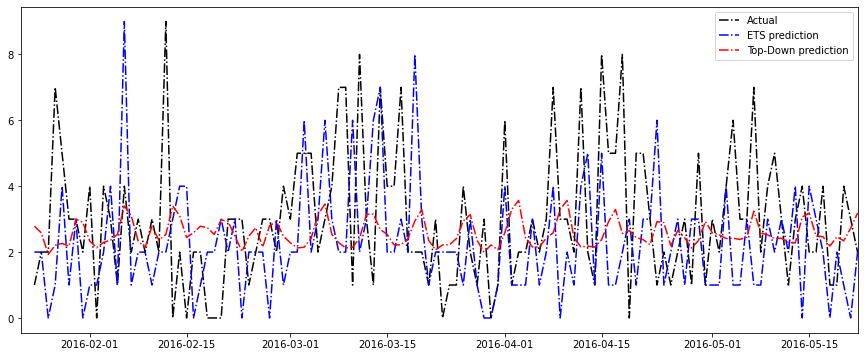

FOODS_1_030
Average sales for foods items is:  4.916666666666667
Root mean squared error is:  3.3491292400662394
sales fraction is:  0.0001692897484933765
(top down) Root mean squared error is:  2.6604774937895397
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7943788677850248


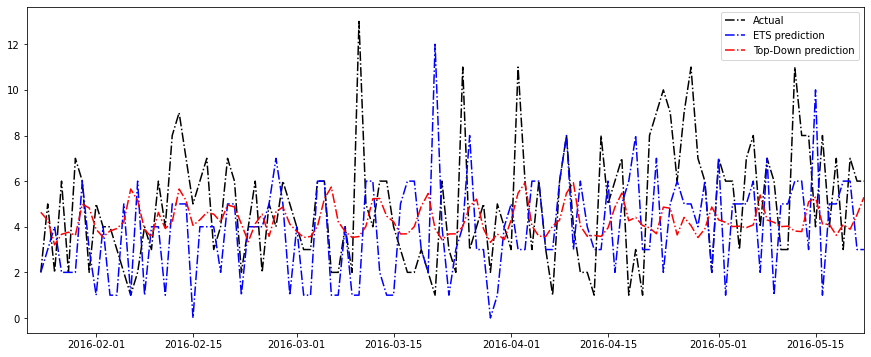

FOODS_1_031
Average sales for foods items is:  13.308333333333334
Root mean squared error is:  7.568024841396862
sales fraction is:  0.0004383567442235076
(top down) Root mean squared error is:  6.163708125528301
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8144407893342274


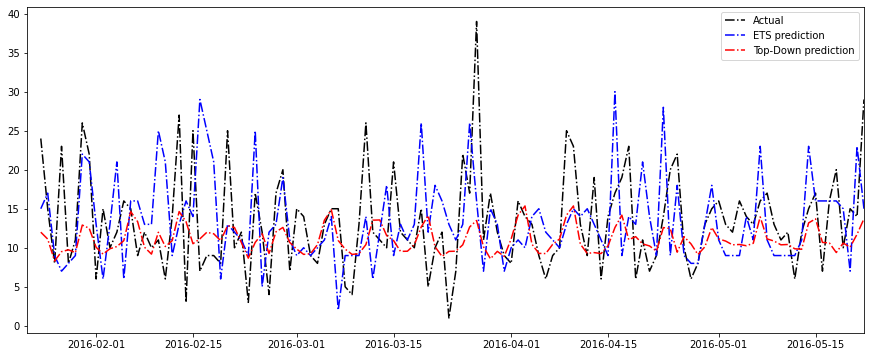

FOODS_1_032
Average sales for foods items is:  69.475
Root mean squared error is:  40.39100559943183
sales fraction is:  0.0028106942490515813
(top down) Root mean squared error is:  23.379386995379523
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.578826564192014


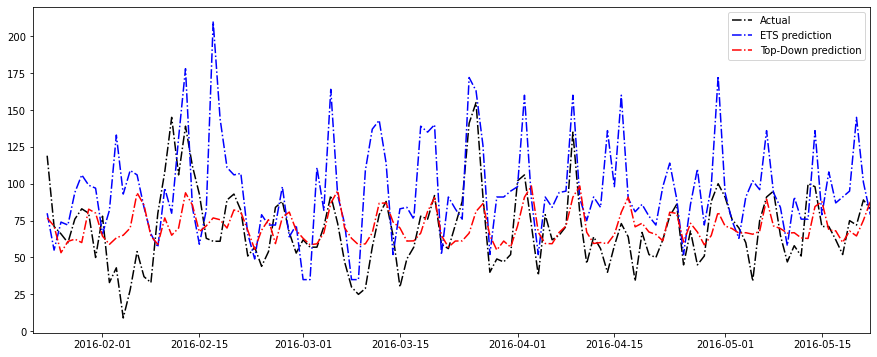

FOODS_1_033
Average sales for foods items is:  2.1166666666666667
Root mean squared error is:  2.4272755646334567
sales fraction is:  5.700213228892133e-05
(top down) Root mean squared error is:  2.083904626576858
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8585364830183789


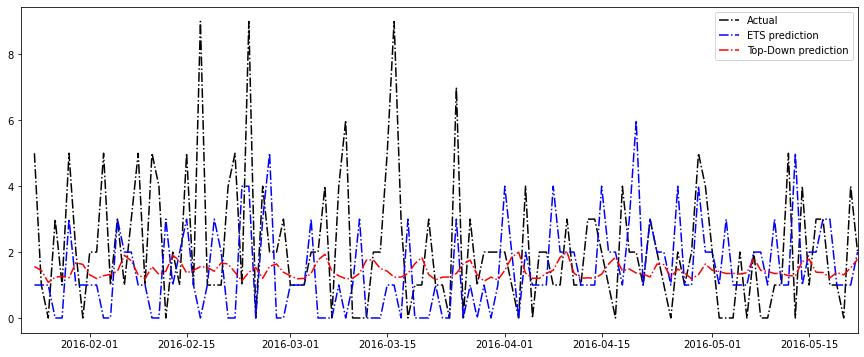

FOODS_1_034
Average sales for foods items is:  6.908333333333333
Root mean squared error is:  4.798437245604031
sales fraction is:  0.0001331695854588125
(top down) Root mean squared error is:  4.435623872236375
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9243892636712008


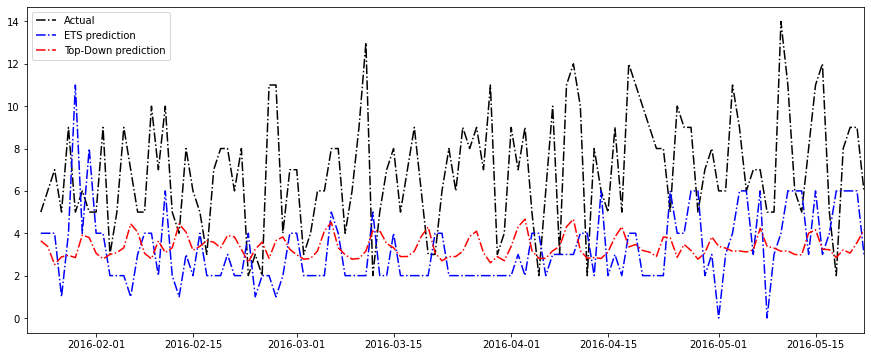

FOODS_1_035
Average sales for foods items is:  10.775
Root mean squared error is:  8.057605103254936
sales fraction is:  0.0001865502951518205
(top down) Root mean squared error is:  8.080696661065392
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.002865809072863


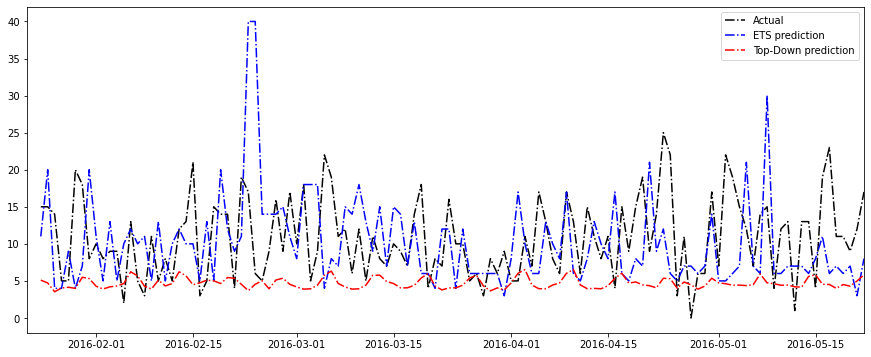

FOODS_1_036
Average sales for foods items is:  15.725
Root mean squared error is:  9.776246723564213
sales fraction is:  0.0005607090933568647
(top down) Root mean squared error is:  6.459948972209742
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6607800677369342


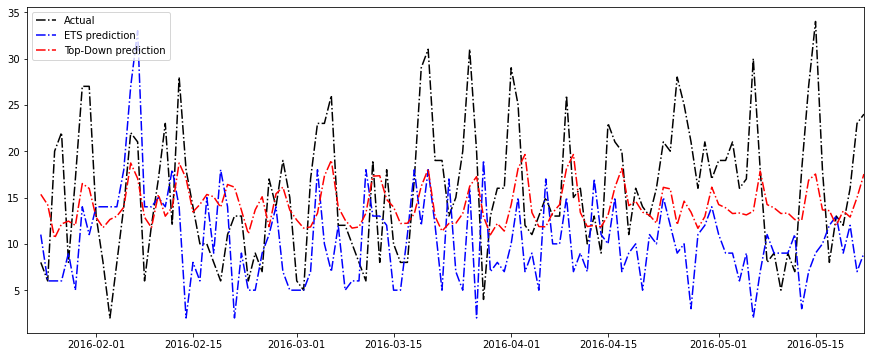

FOODS_1_037
Average sales for foods items is:  11.408333333333333
Root mean squared error is:  7.736278174936576
sales fraction is:  0.00039351224493515245
(top down) Root mean squared error is:  5.993450257025447
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7747201072012361


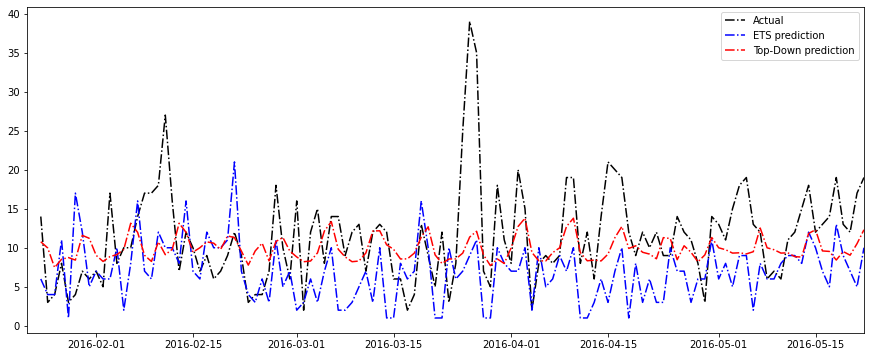

FOODS_1_038
Average sales for foods items is:  5.566666666666666
Root mean squared error is:  5.766281297335398
sales fraction is:  0.0002736995947651631
(top down) Root mean squared error is:  3.5754776251274256
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.620066458911683


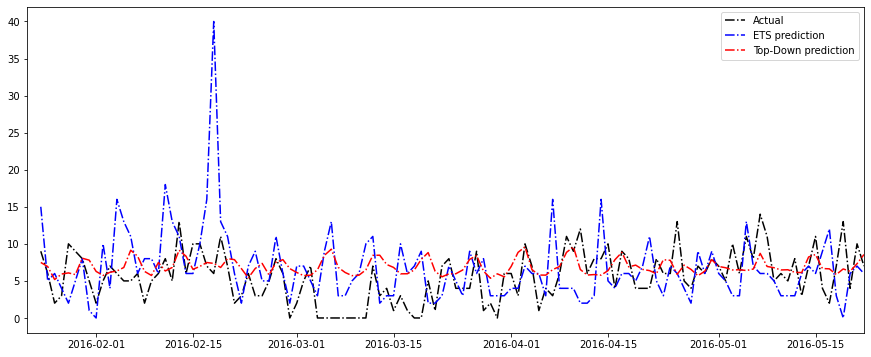

FOODS_1_039
Average sales for foods items is:  3.4
Root mean squared error is:  3.671965867669978
sales fraction is:  0.00010165850572813815
(top down) Root mean squared error is:  3.3610070291047247
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9153154332661131


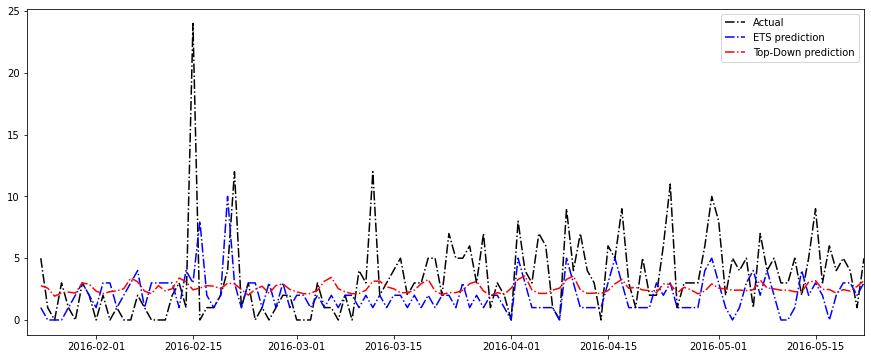

FOODS_1_040
Average sales for foods items is:  13.283333333333333
Root mean squared error is:  6.470445631227162
sales fraction is:  0.000583025522210902
(top down) Root mean squared error is:  5.512451854416669
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8519431533143409


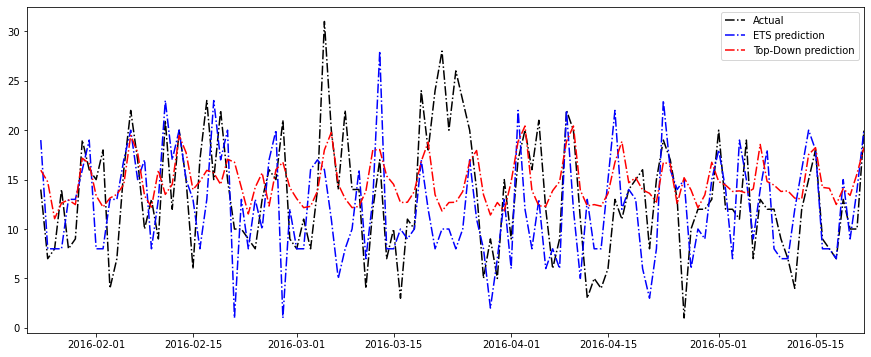

FOODS_1_041
Average sales for foods items is:  8.725
Root mean squared error is:  5.623610939600996
sales fraction is:  0.00032646889544847145
(top down) Root mean squared error is:  3.774938100705098
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6712658719191082


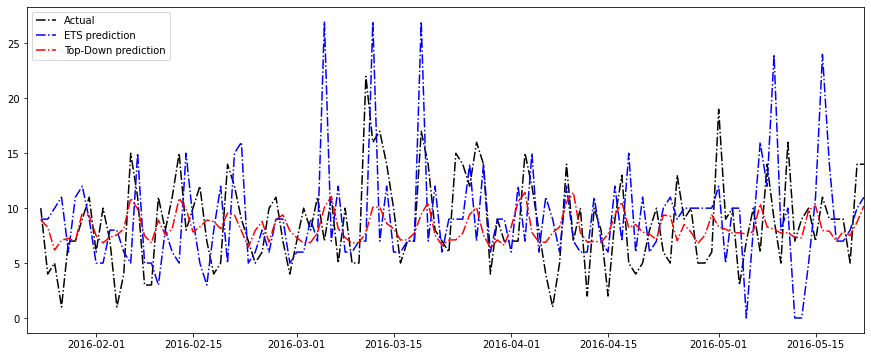

FOODS_1_042
Average sales for foods items is:  36.15
Root mean squared error is:  16.136655993937115
sales fraction is:  0.0010087778345421398
(top down) Root mean squared error is:  16.397335873662733
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0161545167613142


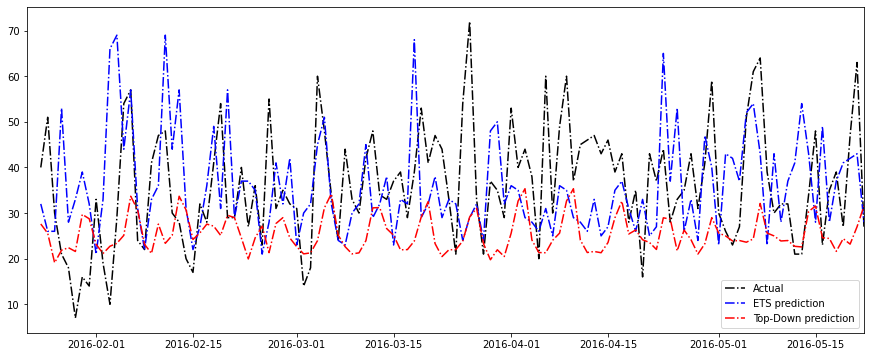

FOODS_1_043
Average sales for foods items is:  35.666666666666664
Root mean squared error is:  71.8971487612687
sales fraction is:  0.0030086026423451298
(top down) Root mean squared error is:  68.5850058973991
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9539322084264089


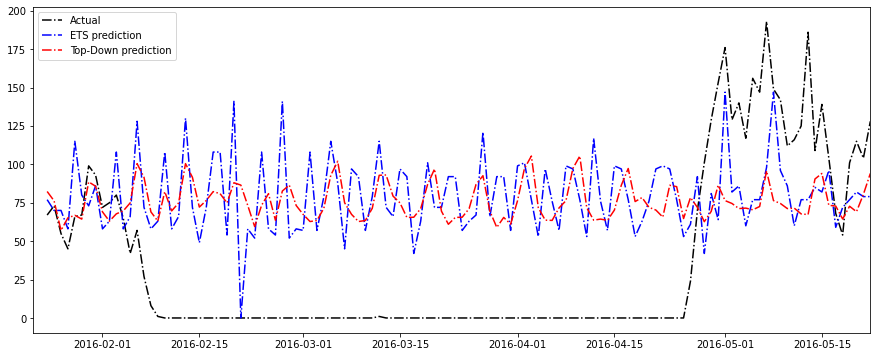

FOODS_1_044
Average sales for foods items is:  11.066666666666666
Root mean squared error is:  8.235087532422874
sales fraction is:  0.0006417913343354954
(top down) Root mean squared error is:  6.74969669760721
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8196265881853181


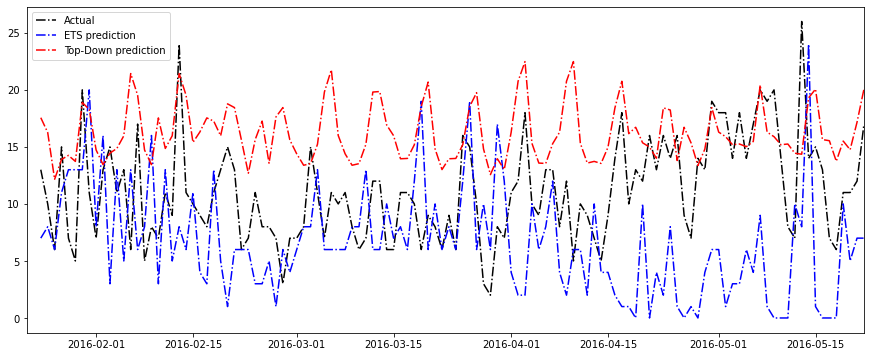

FOODS_1_045
Average sales for foods items is:  13.916666666666666
Root mean squared error is:  8.048291744215042
sales fraction is:  0.0006370646723758942
(top down) Root mean squared error is:  7.088086829435492
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8806945690717876


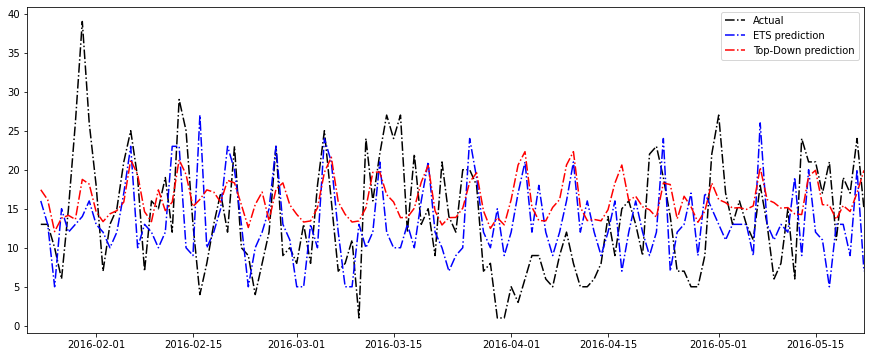

FOODS_1_046
Average sales for foods items is:  57.141666666666666
Root mean squared error is:  27.173209845973908
sales fraction is:  0.0028453329210241804
(top down) Root mean squared error is:  23.09361544289916
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8498670408759532


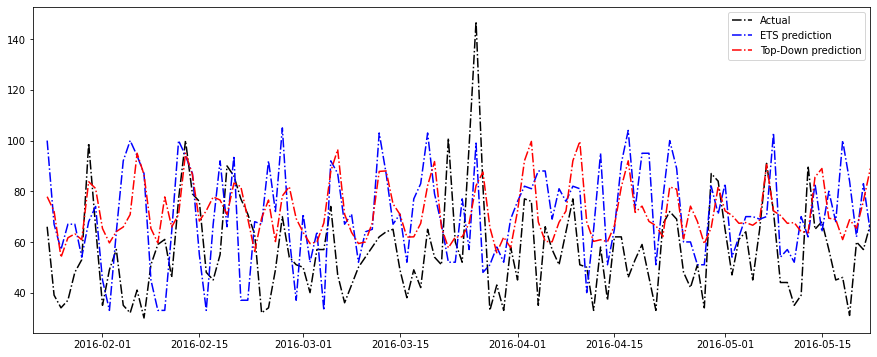

FOODS_1_047
Average sales for foods items is:  10.883333333333333
Root mean squared error is:  6.913754406977442
sales fraction is:  0.000439744172360903
(top down) Root mean squared error is:  4.976454364075518
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7197904454131638


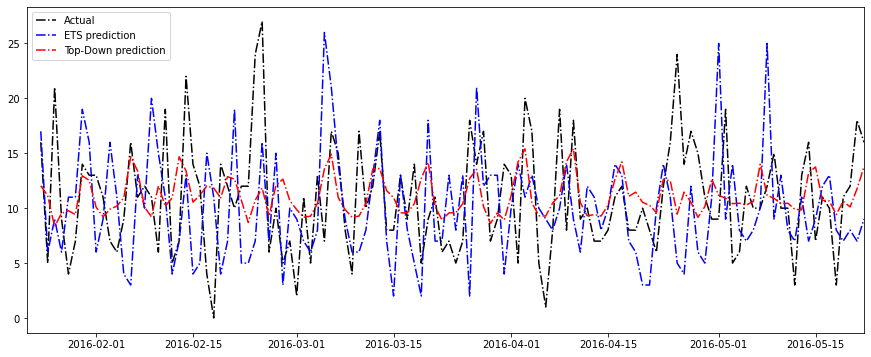

FOODS_1_048
Average sales for foods items is:  5.8
Root mean squared error is:  3.5237290853109955
sales fraction is:  0.0001762739206426379
(top down) Root mean squared error is:  3.358191004084194
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9530219045735204


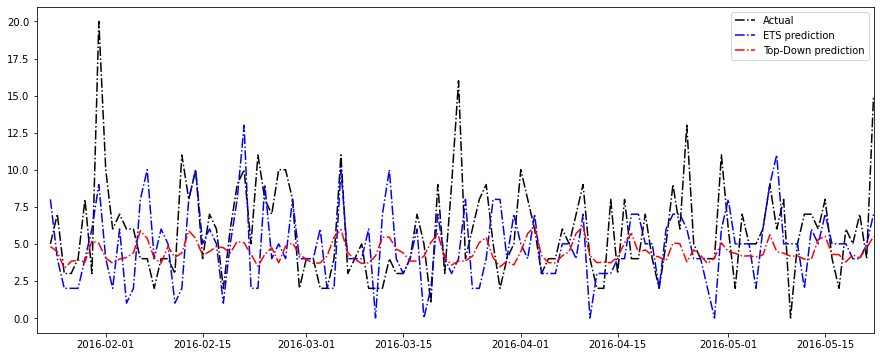

FOODS_1_049
Average sales for foods items is:  5.55
Root mean squared error is:  6.774338836127601
sales fraction is:  0.0002642227551148185
(top down) Root mean squared error is:  4.733140866081439
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6986867619965453


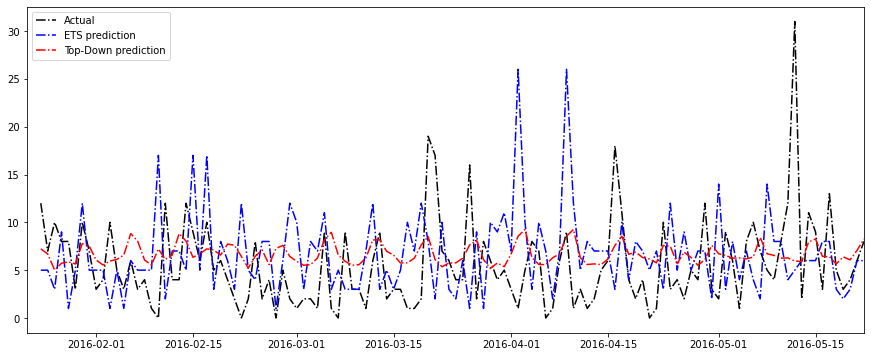

FOODS_1_050
Average sales for foods items is:  5.108333333333333
Root mean squared error is:  4.0269922605670185
sales fraction is:  0.00010843103629711891
(top down) Root mean squared error is:  3.877719127671643
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9629318550330769


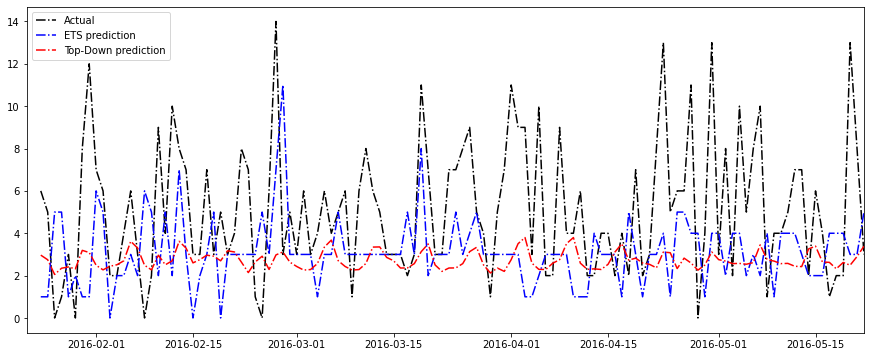

FOODS_1_051
Average sales for foods items is:  13.15
Root mean squared error is:  6.019413038937712
sales fraction is:  0.0002688318384187082
(top down) Root mean squared error is:  7.979619803510186
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.325647492852294


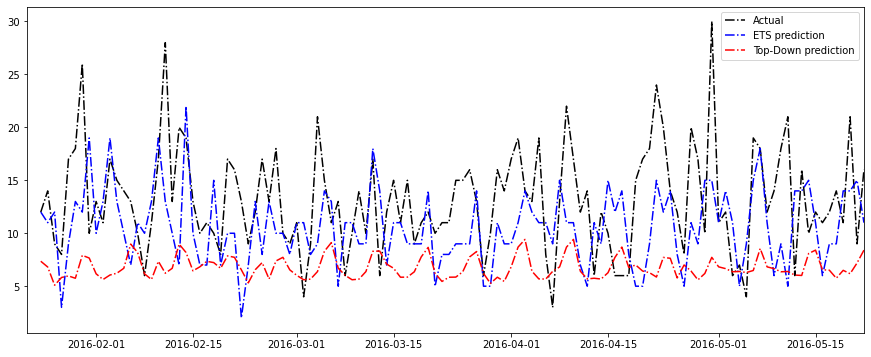

FOODS_1_052
Average sales for foods items is:  10.283333333333333
Root mean squared error is:  6.458198923332521
sales fraction is:  0.00028167142762240086
(top down) Root mean squared error is:  6.04607987259104
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9361866898753218


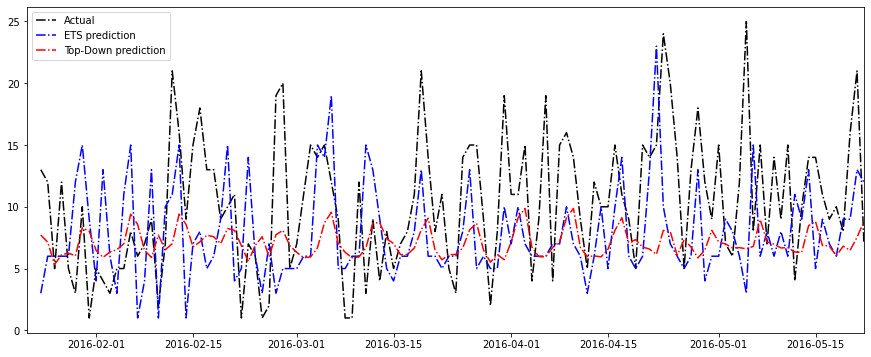

FOODS_1_053
Average sales for foods items is:  4.058333333333334
Root mean squared error is:  2.8092110398947723
sales fraction is:  0.00016442199214692158
(top down) Root mean squared error is:  2.377556079587393
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8463429930406552


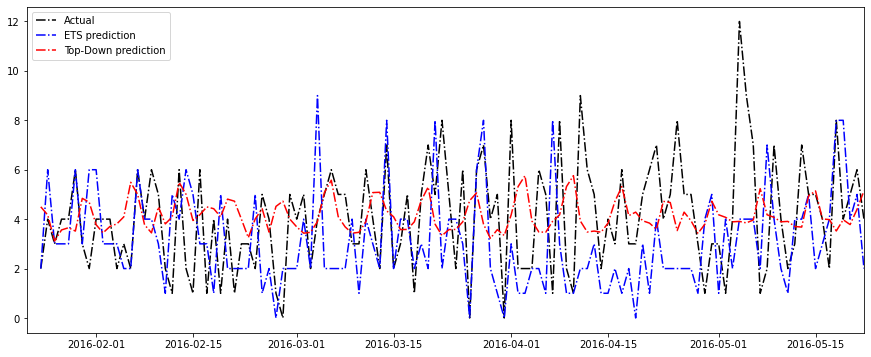

FOODS_1_054
Average sales for foods items is:  11.125
Root mean squared error is:  6.67020739307757
sales fraction is:  0.0005096564410469439
(top down) Root mean squared error is:  5.280433433396298
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7916445654862849


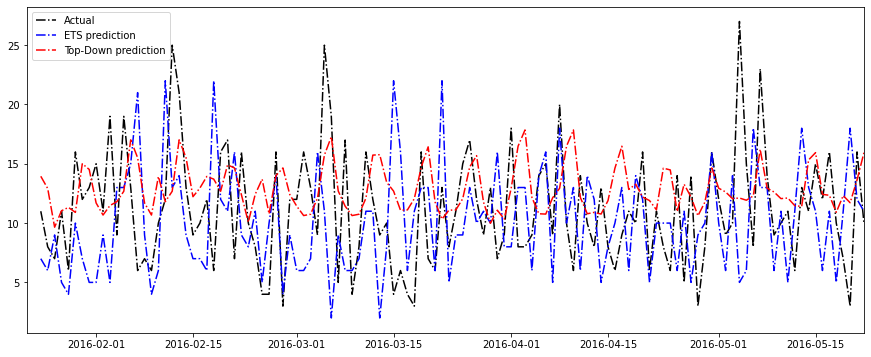

FOODS_1_055
Average sales for foods items is:  37.05833333333333
Root mean squared error is:  53.58715642141625
sales fraction is:  0.001262677183685491
(top down) Root mean squared error is:  38.3886686571481
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7163781626189436


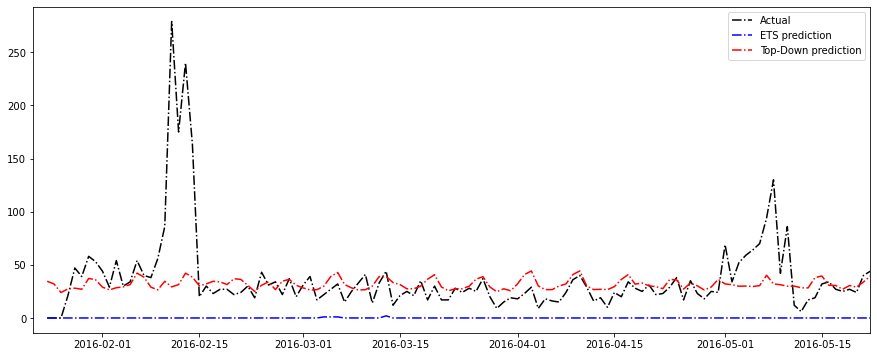

FOODS_1_056
Average sales for foods items is:  1.9666666666666666
Root mean squared error is:  5.24563310446572
sales fraction is:  7.082938220059036e-05
(top down) Root mean squared error is:  3.3407678676485526
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6368664756222628


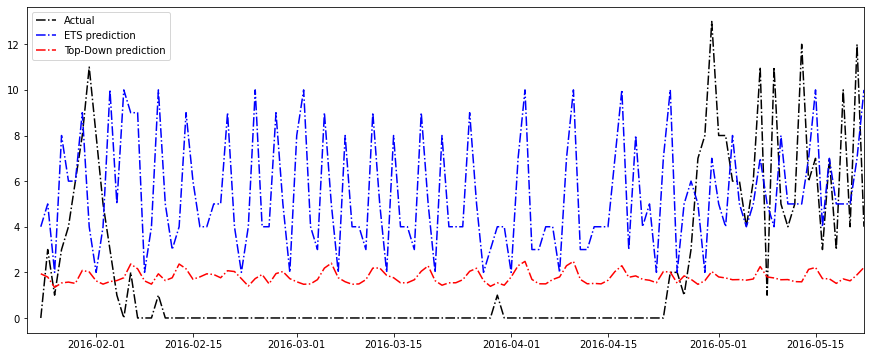

FOODS_1_057
Average sales for foods items is:  2.4
Root mean squared error is:  5.251190341246449
sales fraction is:  8.613812317422393e-05
(top down) Root mean squared error is:  3.823362389202612
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7280944206442684


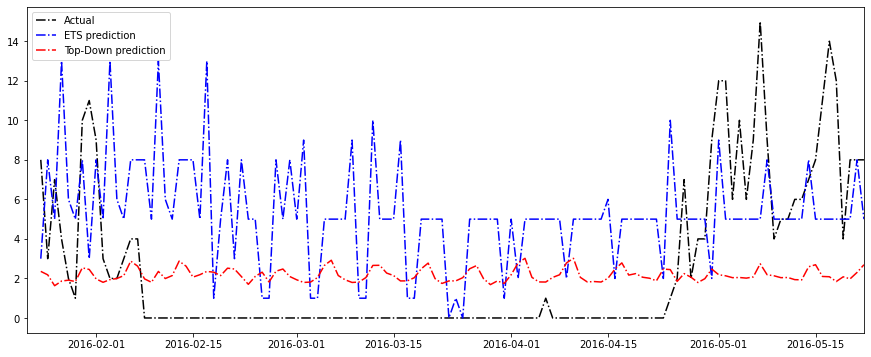

FOODS_1_058
Average sales for foods items is:  11.416666666666666
Root mean squared error is:  33.7600602290142
sales fraction is:  0.0012626536679543488
(top down) Root mean squared error is:  27.328202312408845
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8094832215056991


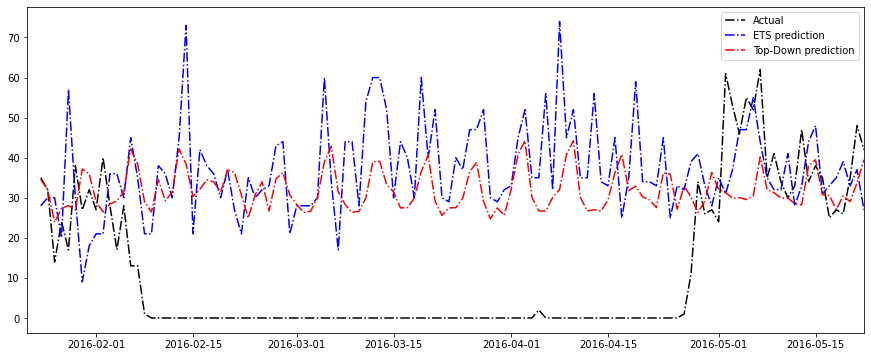

FOODS_1_059
Average sales for foods items is:  13.483333333333333
Root mean squared error is:  6.489093413823948
sales fraction is:  0.00021886090974133283
(top down) Root mean squared error is:  9.656734375451434
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.4881484607509805


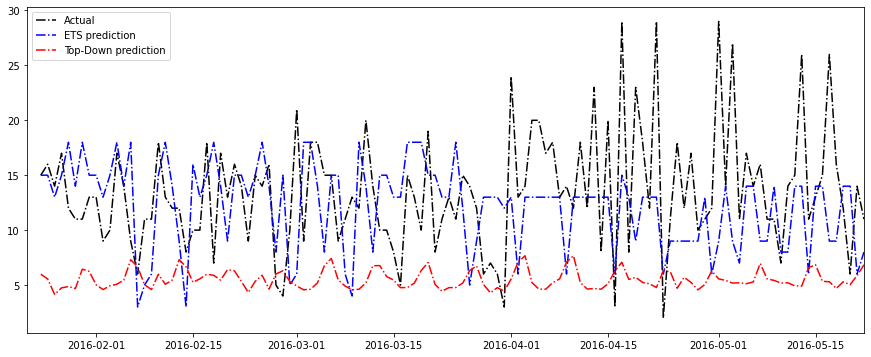

FOODS_1_060
Average sales for foods items is:  5.508333333333334
Root mean squared error is:  4.1492971292336565
sales fraction is:  6.622029889670068e-05
(top down) Root mean squared error is:  5.194830828228852
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.25197850778845


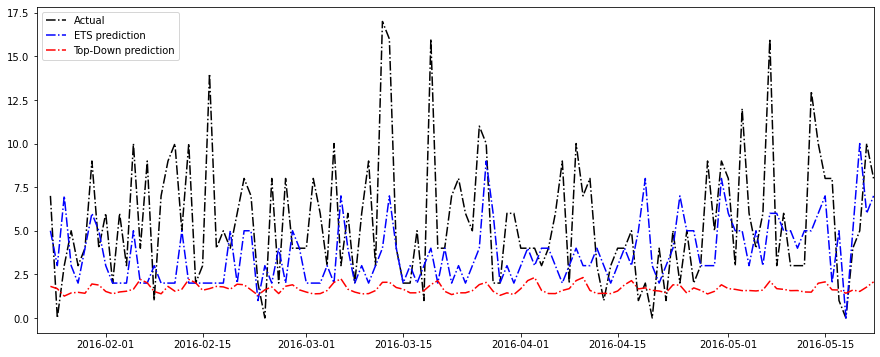

FOODS_1_061
Average sales for foods items is:  18.666666666666668
Root mean squared error is:  8.307627017787128
sales fraction is:  0.0009079894108662667
(top down) Root mean squared error is:  7.561180745398885
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9101492795969226


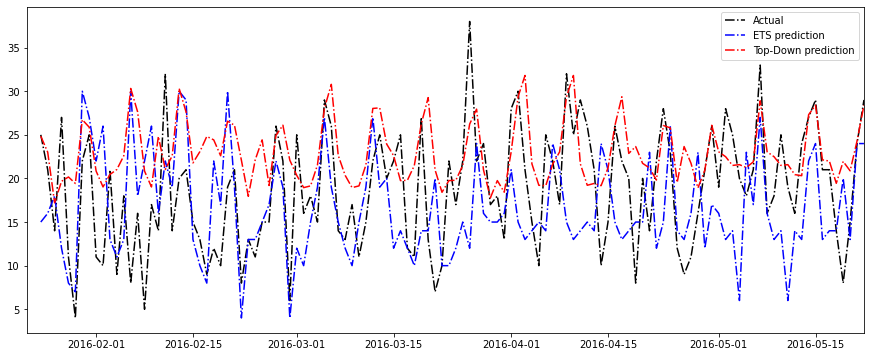

FOODS_1_062
Average sales for foods items is:  7.5
Root mean squared error is:  6.736715322271926
sales fraction is:  0.00023645067663576895
(top down) Root mean squared error is:  5.743201187245554
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8525224701507331


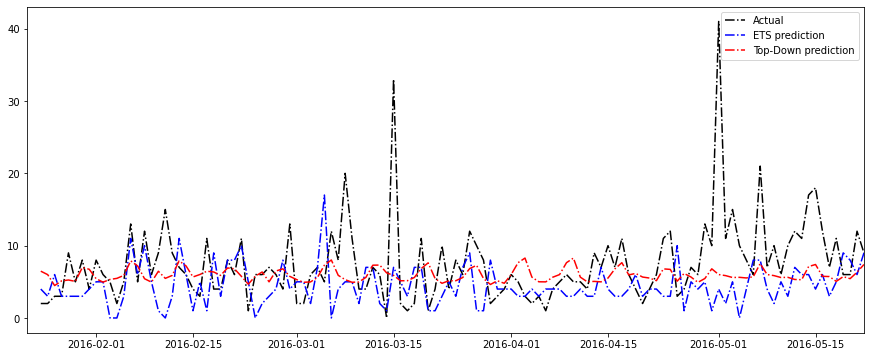

FOODS_1_063
Average sales for foods items is:  9.883333333333333
Root mean squared error is:  6.700746227100382
sales fraction is:  0.0004161108625628972
(top down) Root mean squared error is:  5.025437541304424
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7499817738179116


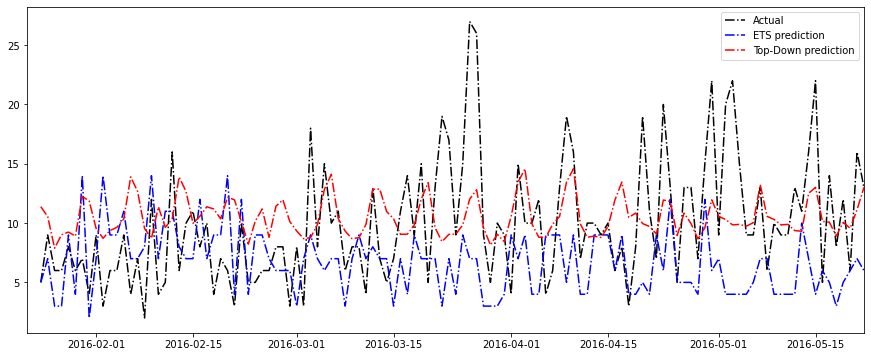

FOODS_1_064
Average sales for foods items is:  4.925
Root mean squared error is:  3.987480407475377
sales fraction is:  0.00025792053916868363
(top down) Root mean squared error is:  3.3838510682854825
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8486188576479866


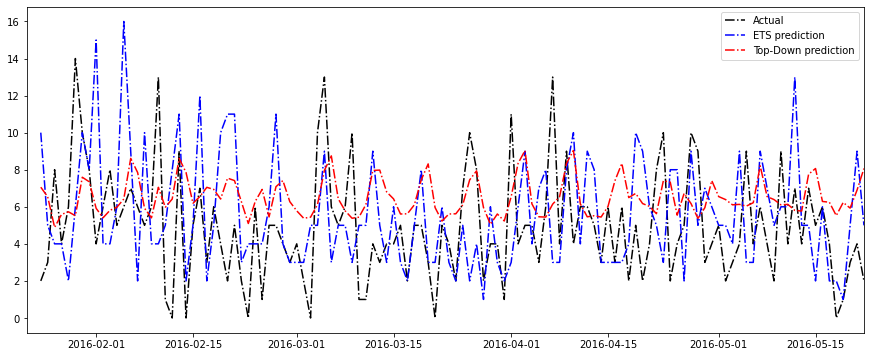

FOODS_1_065
Average sales for foods items is:  8.741666666666667
Root mean squared error is:  5.730037812557028
sales fraction is:  0.00025222973223224844
(top down) Root mean squared error is:  4.636211906972076
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8091066863140242


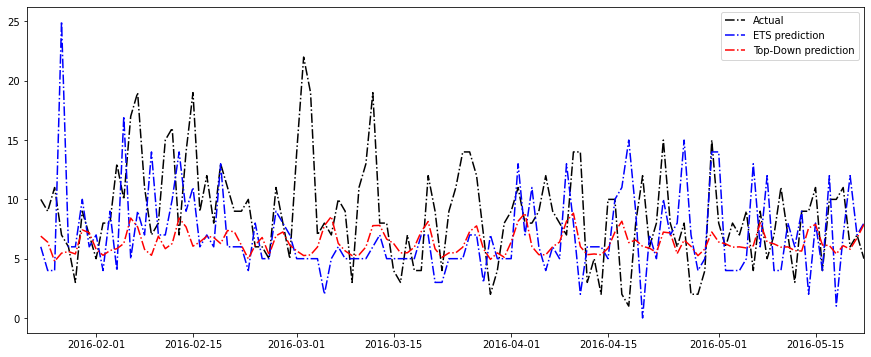

FOODS_1_066
Average sales for foods items is:  9.675
Root mean squared error is:  5.911147660705717
sales fraction is:  0.0003725126970250836
(top down) Root mean squared error is:  4.6200244319693
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.78157824794005


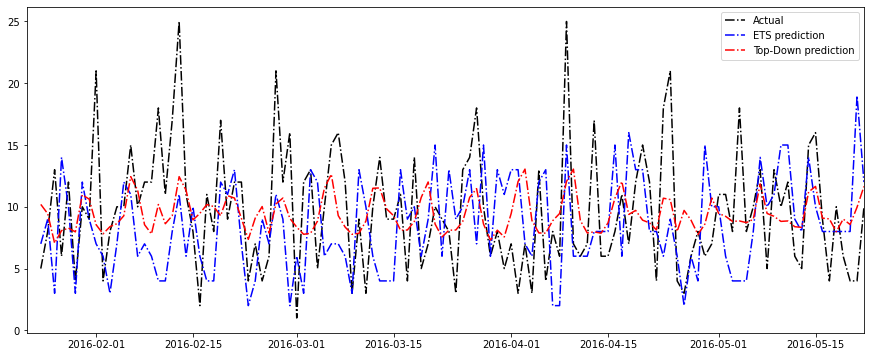

FOODS_1_067
Average sales for foods items is:  24.491666666666667
Root mean squared error is:  21.55400194859414
sales fraction is:  0.0011816890056314297
(top down) Root mean squared error is:  11.80663827320268
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.547770121825231


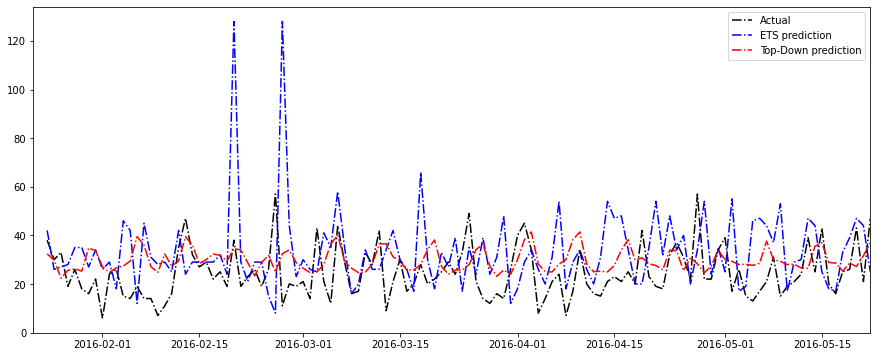

FOODS_1_068
Average sales for foods items is:  2.0416666666666665
Root mean squared error is:  2.7898626011567904
sales fraction is:  0.00011271089936501647
(top down) Root mean squared error is:  1.7639043797353502
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6322549286133173


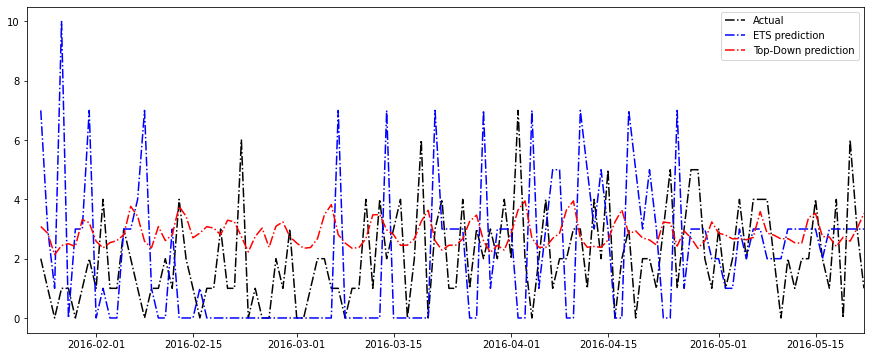

FOODS_1_069
Average sales for foods items is:  16.166666666666668
Root mean squared error is:  10.22456193030619
sales fraction is:  0.00036581071364952977
(top down) Root mean squared error is:  10.654135703017301
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0420139049124275


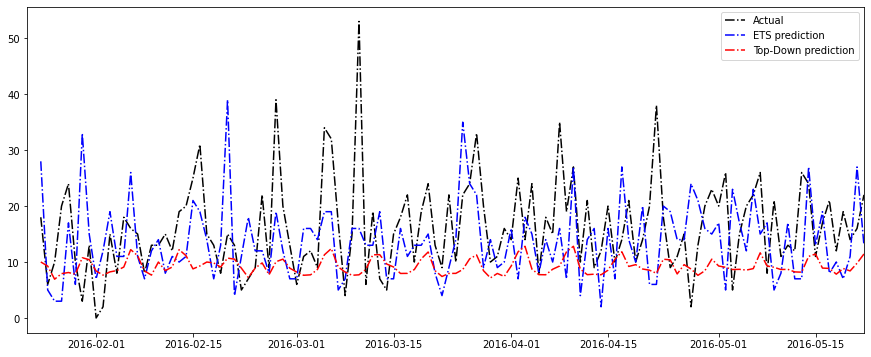

FOODS_1_070
Average sales for foods items is:  8.558333333333334
Root mean squared error is:  6.022181221672648
sales fraction is:  0.00018979546604945712
(top down) Root mean squared error is:  6.048411587693986
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0043556254878117


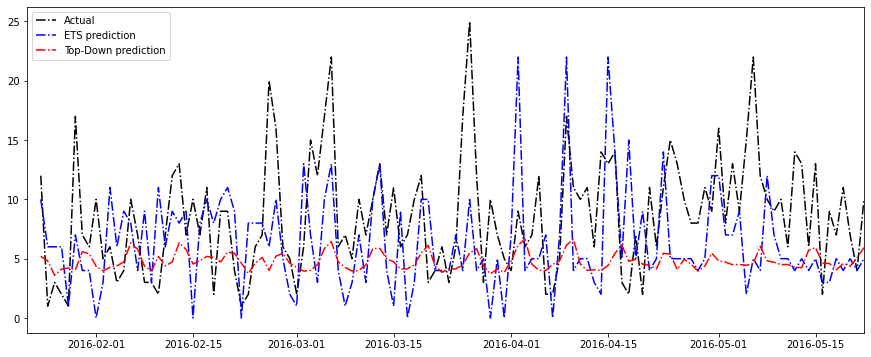

FOODS_1_071
Average sales for foods items is:  11.666666666666666
Root mean squared error is:  7.78138805098422
sales fraction is:  0.000218555205236483
(top down) Root mean squared error is:  9.144630748258699
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.175192740465122


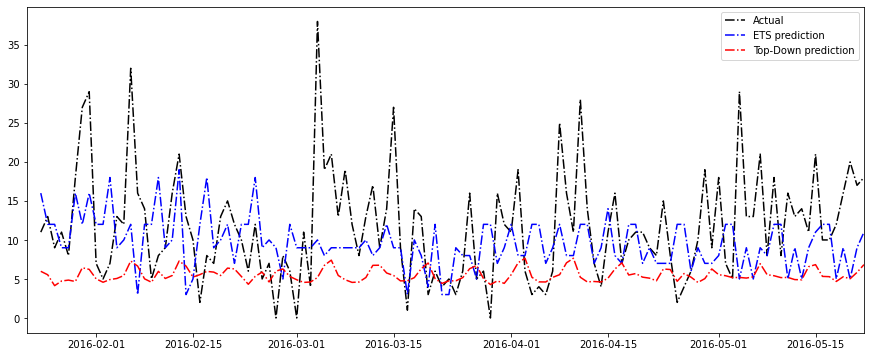

FOODS_1_072
Average sales for foods items is:  7.225
Root mean squared error is:  4.6097722286464435
sales fraction is:  0.000165174495543475
(top down) Root mean squared error is:  4.613525834089383
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0008142713472075


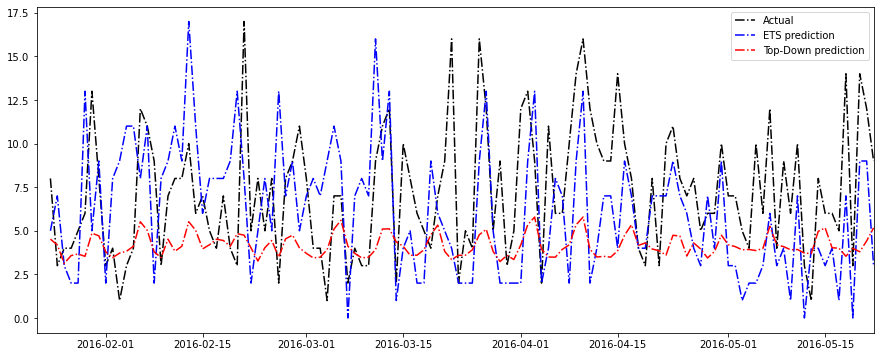

FOODS_1_073
Average sales for foods items is:  6.008333333333334
Root mean squared error is:  4.068169121361598
sales fraction is:  0.0002680087878287279
(top down) Root mean squared error is:  3.358721719106391
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8256101501459314


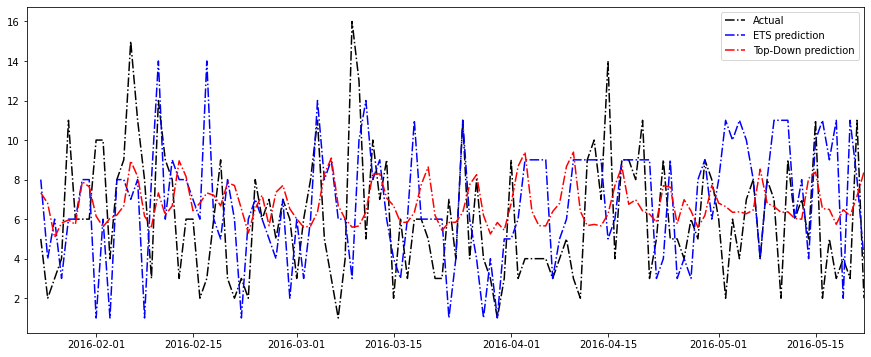

FOODS_1_074
Average sales for foods items is:  10.658333333333333
Root mean squared error is:  6.401822657129244
sales fraction is:  0.00045058492441750063
(top down) Root mean squared error is:  4.0314602882312105
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6297363273163569


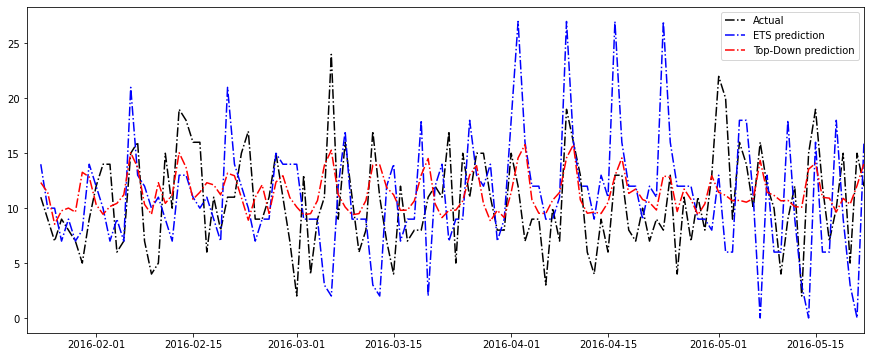

FOODS_1_075
Average sales for foods items is:  4.25
Root mean squared error is:  4.075332297289797
sales fraction is:  0.0002424001566147694
(top down) Root mean squared error is:  3.286915286680099
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8065392088066007


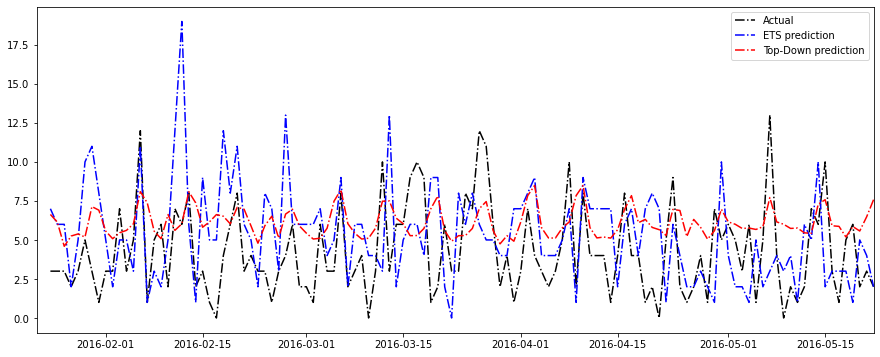

FOODS_1_076
Average sales for foods items is:  10.083333333333334
Root mean squared error is:  5.208966628164681
sales fraction is:  0.00031148937471083
(top down) Root mean squared error is:  4.628787954426624
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8886192377196173


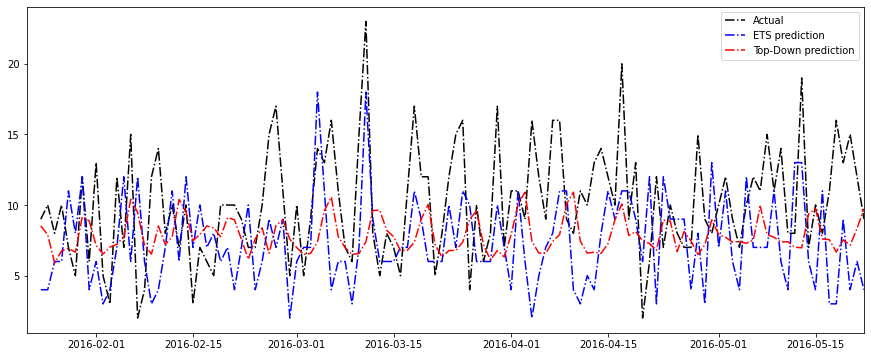

FOODS_1_077
Average sales for foods items is:  2.2333333333333334
Root mean squared error is:  2.217355782608345
sales fraction is:  5.871878066230881e-05
(top down) Root mean squared error is:  1.7676265642879057
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7971776916235748


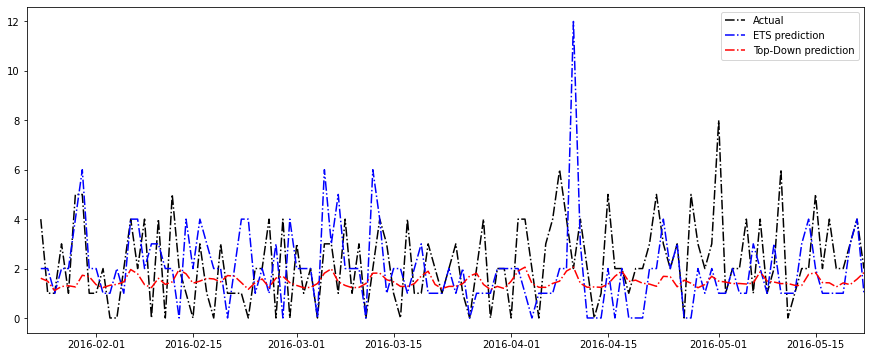

FOODS_1_078
Average sales for foods items is:  6.033333333333333
Root mean squared error is:  4.033195589934446
sales fraction is:  0.00010358679568180628
(top down) Root mean squared error is:  4.673730323581825
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.158815688295888


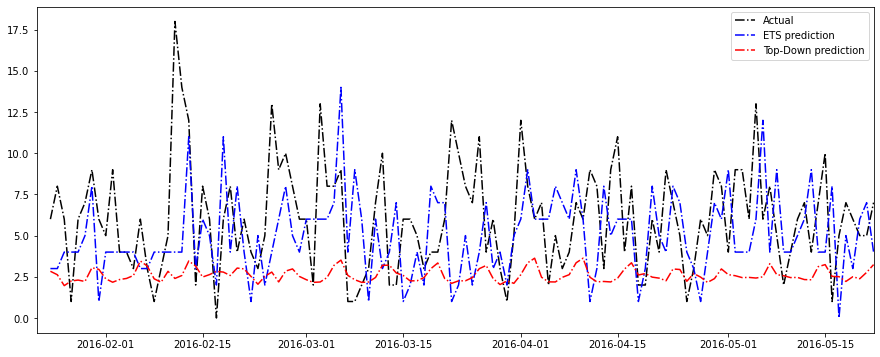

FOODS_1_079
Average sales for foods items is:  1.3833333333333333
Root mean squared error is:  2.1213203435596424
sales fraction is:  3.6872666431117426e-05
(top down) Root mean squared error is:  1.7435804768979644
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8219317191726835


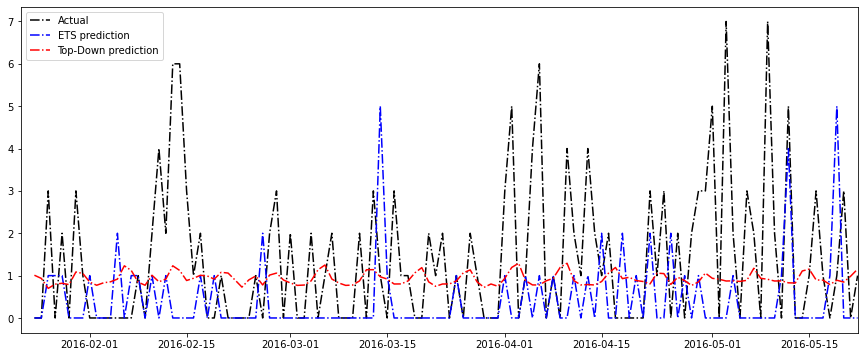

FOODS_1_080
Average sales for foods items is:  6.35
Root mean squared error is:  4.366539438350084
sales fraction is:  0.00023901389133027903
(top down) Root mean squared error is:  3.4798762095073403
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7969414358071679


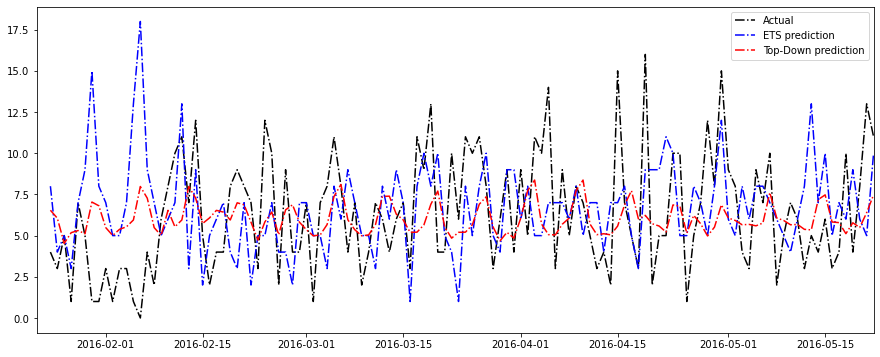

FOODS_1_081
Average sales for foods items is:  8.866666666666667
Root mean squared error is:  5.2922899895350906
sales fraction is:  0.00030765631053463605
(top down) Root mean squared error is:  5.203623653381067
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9832461304408202


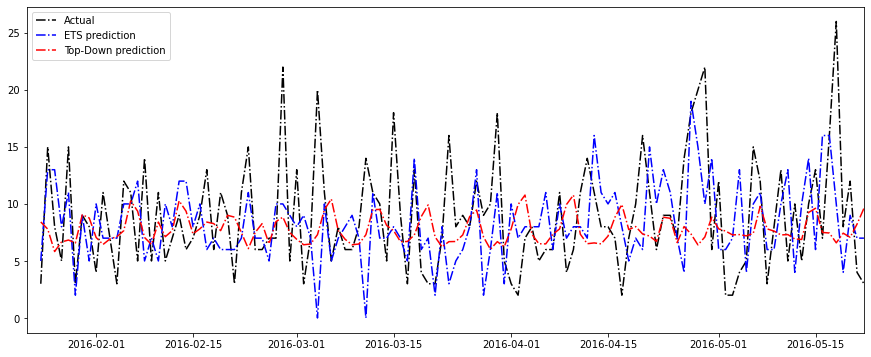

FOODS_1_082
Average sales for foods items is:  59.68333333333333
Root mean squared error is:  22.477952160580227
sales fraction is:  0.0014626314455884195
(top down) Root mean squared error is:  31.019152668404836
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.3799812566023422


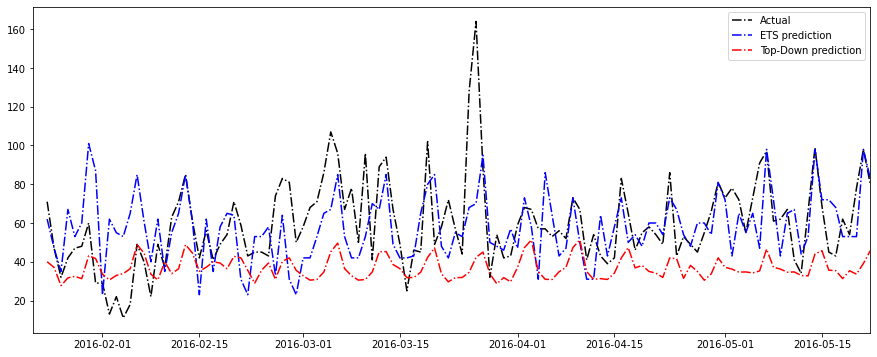

FOODS_1_083
Average sales for foods items is:  18.258333333333333
Root mean squared error is:  12.86856635371633
sales fraction is:  0.0007790056255507825
(top down) Root mean squared error is:  9.652468799222305
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7500811305553673


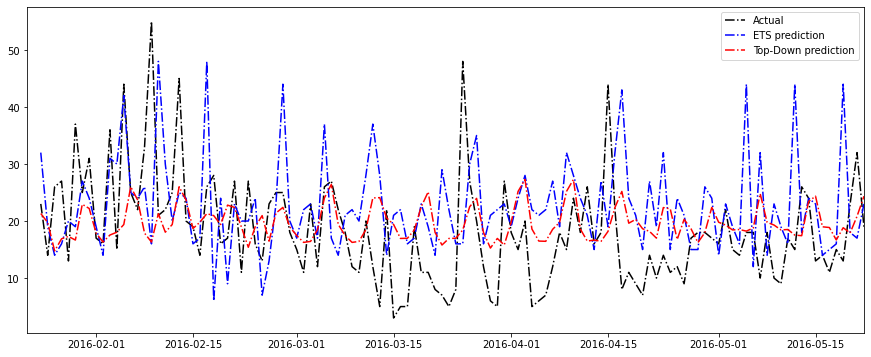

FOODS_1_084
Average sales for foods items is:  3.9916666666666667
Root mean squared error is:  4.344536799245692
sales fraction is:  3.9600491243623566e-05
(top down) Root mean squared error is:  4.217496472464036
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.9707586026653721


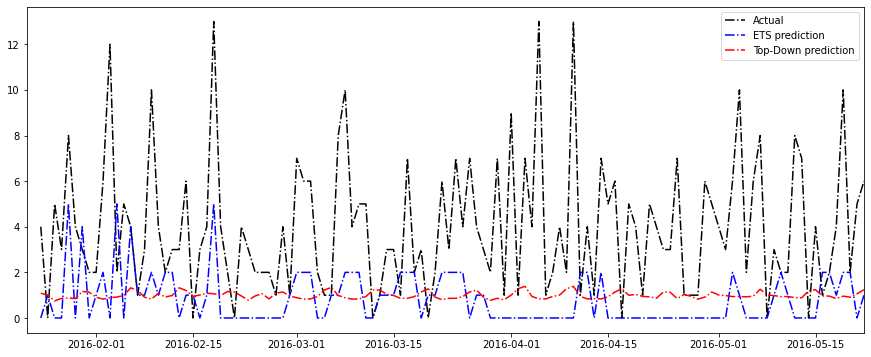

FOODS_1_085
Average sales for foods items is:  89.89166666666667
Root mean squared error is:  28.105456172541775
sales fraction is:  0.003300668023132425
(top down) Root mean squared error is:  23.29345070399112
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8287874980925645


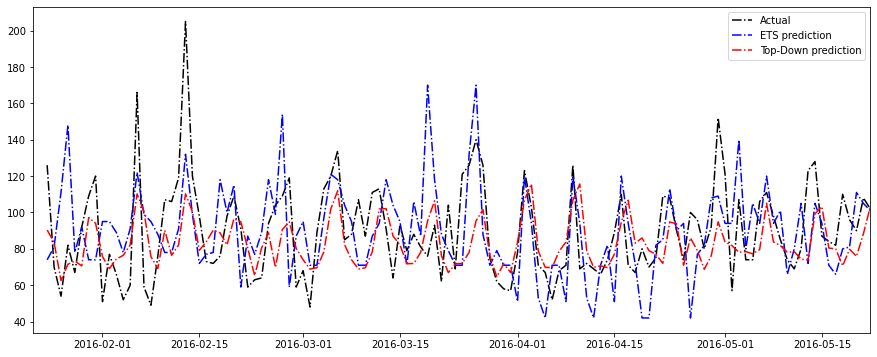

FOODS_1_086
Average sales for foods items is:  19.125
Root mean squared error is:  10.719919153924002
sales fraction is:  0.0010930346992249803
(top down) Root mean squared error is:  13.141815358060104
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.2259248572084214


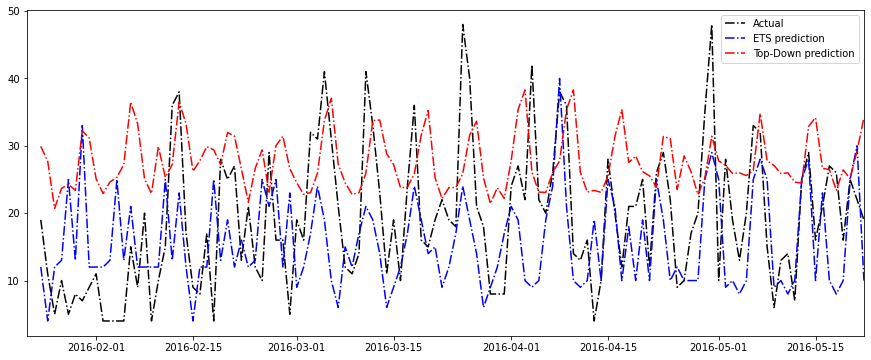

FOODS_1_087
Average sales for foods items is:  30.25
Root mean squared error is:  11.279775411475768
sales fraction is:  0.000853197757304721
(top down) Root mean squared error is:  12.036523359998055
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0670889198513998


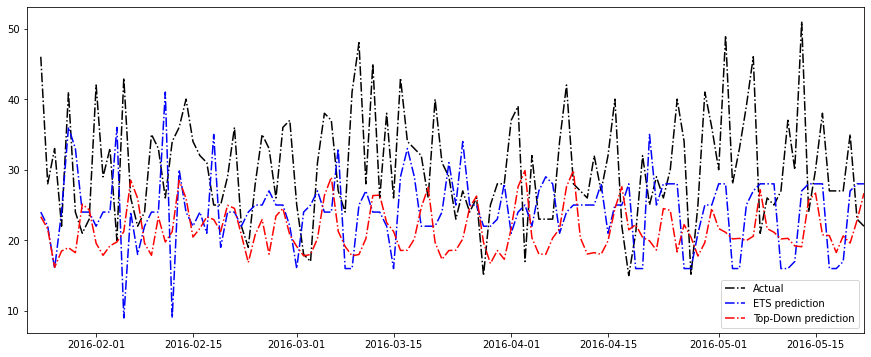

FOODS_1_088
Average sales for foods items is:  17.141666666666666
Root mean squared error is:  12.409337881880187
sales fraction is:  0.0006564416348371448
(top down) Root mean squared error is:  9.95309777077154
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8020651758789493


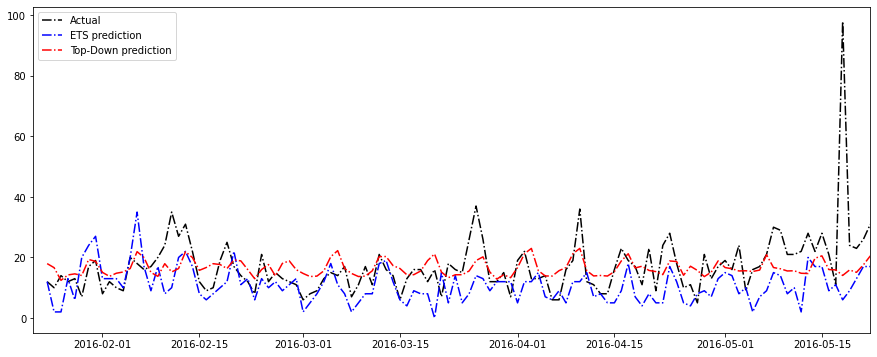

FOODS_1_089
Average sales for foods items is:  5.283333333333333
Root mean squared error is:  4.108933357129723
sales fraction is:  5.9635894176858284e-05
(top down) Root mean squared error is:  4.843415275122275
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.1787524532901215


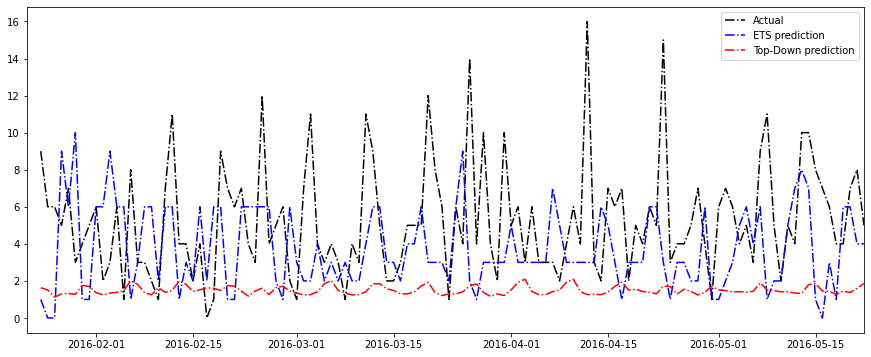

FOODS_1_090
Average sales for foods items is:  9.066666666666666
Root mean squared error is:  6.758944690802946
sales fraction is:  0.0002748283498599932
(top down) Root mean squared error is:  4.707717757705575
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.6965166861198726


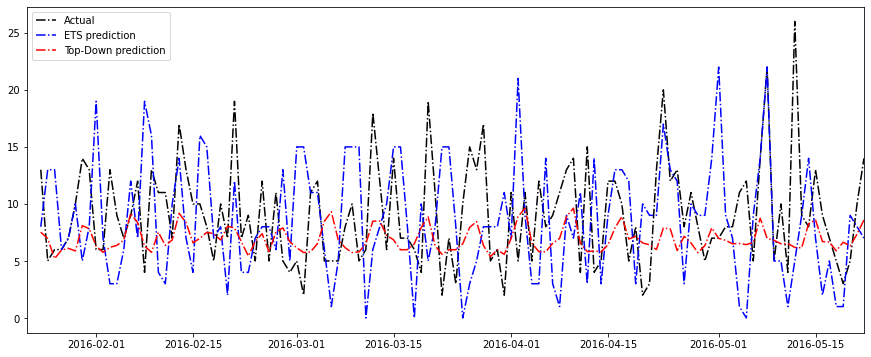

FOODS_1_091
Average sales for foods items is:  2.975
Root mean squared error is:  8.719231617522269
sales fraction is:  0.00027473428693542405
(top down) Root mean squared error is:  6.3607931538305795
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7295130388608849


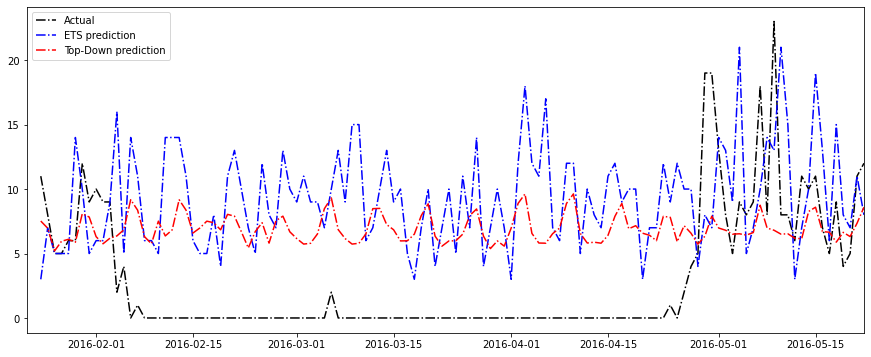

FOODS_1_092
Average sales for foods items is:  12.066666666666666
Root mean squared error is:  7.042135092900922
sales fraction is:  0.0004957351282107057
(top down) Root mean squared error is:  4.9834279879084775
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7076586748431171


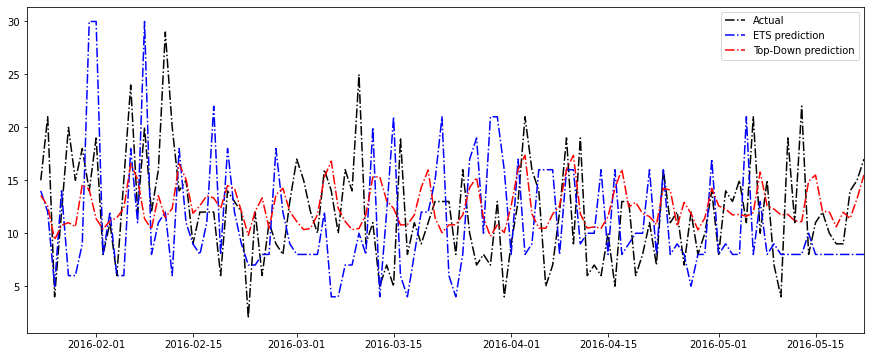

FOODS_1_093
Average sales for foods items is:  4.366666666666666
Root mean squared error is:  3.5543400700176866
sales fraction is:  0.00012635002342754716
(top down) Root mean squared error is:  2.862939001651951
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8054769507853268


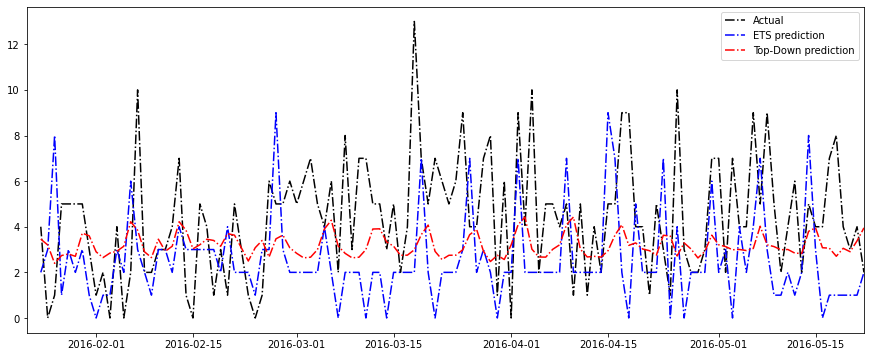

FOODS_1_094
Average sales for foods items is:  11.933333333333334
Root mean squared error is:  7.656152210259842
sales fraction is:  0.0004158286737891897
(top down) Root mean squared error is:  6.074031204475349
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7933529843275154


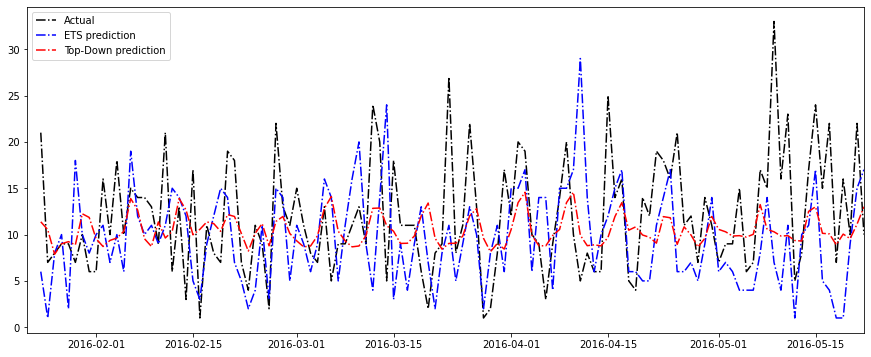

FOODS_1_095
Average sales for foods items is:  4.0
Root mean squared error is:  4.140249589899946
sales fraction is:  0.0001745337565381081
(top down) Root mean squared error is:  3.0006395017263747
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7247484569641341


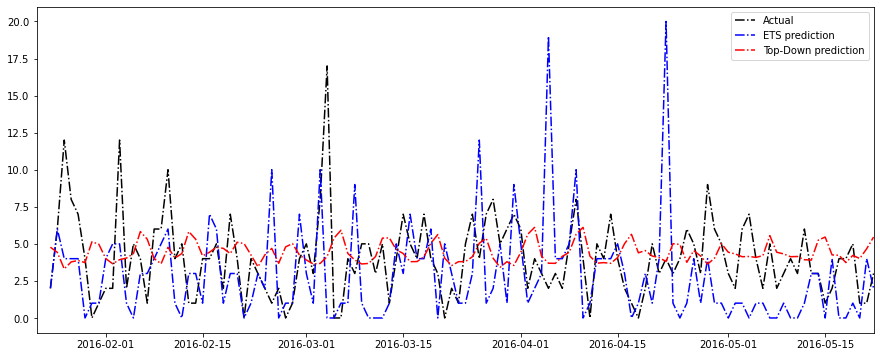

FOODS_1_096
Average sales for foods items is:  132.725
Root mean squared error is:  51.80797879348959
sales fraction is:  0.0018831397498749256
(top down) Root mean squared error is:  90.0049880395381
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.7372804370211894


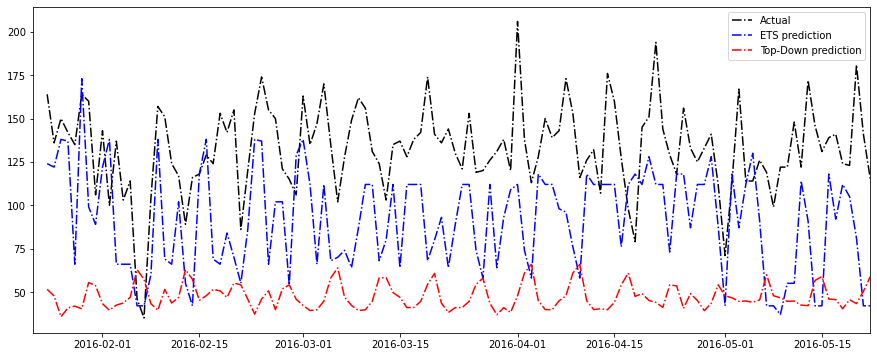

FOODS_1_097
Average sales for foods items is:  22.058333333333334
Root mean squared error is:  11.151233115669315
sales fraction is:  0.0005538424998633148
(top down) Root mean squared error is:  11.808340016870797
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.0589268374524552


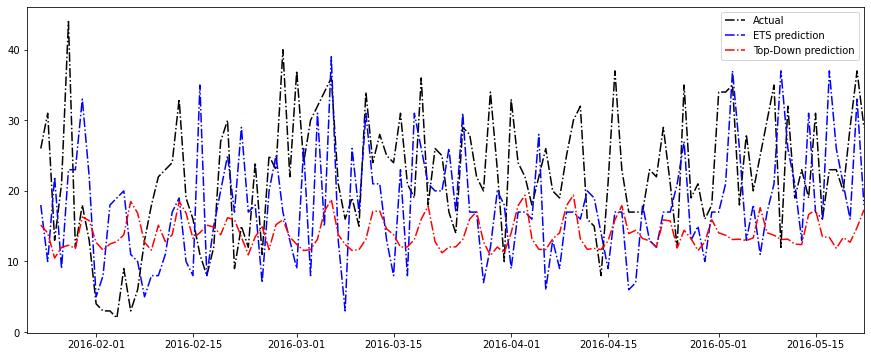

FOODS_1_098
Average sales for foods items is:  10.391666666666667
Root mean squared error is:  7.757791782030073
sales fraction is:  0.00011470973651211149
(top down) Root mean squared error is:  9.099705941022354
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.172976305203325


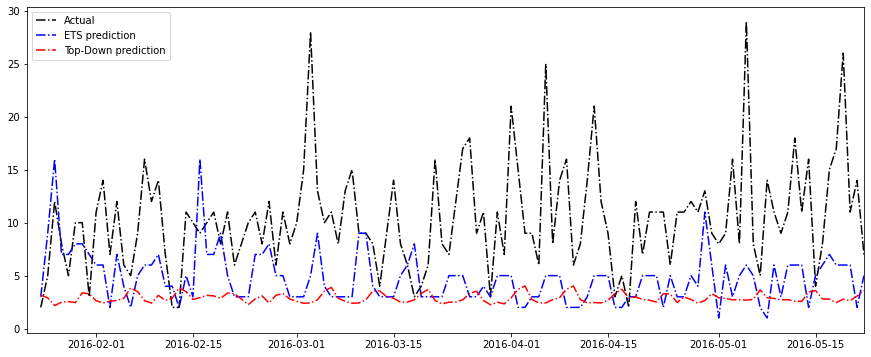

FOODS_1_099
Average sales for foods items is:  68.475
Root mean squared error is:  23.549239195070967
sales fraction is:  0.0013507200810822409
(top down) Root mean squared error is:  38.448896317927506
RMSE ratio between (top-down)HTS:(Random Forest)TS =  1.6327022711619128


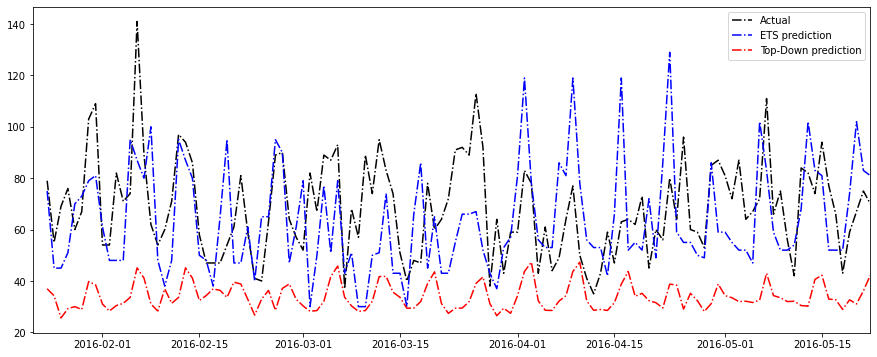

FOODS_1_101
Average sales for foods items is:  7.191666666666666
Root mean squared error is:  4.706378650300037
sales fraction is:  0.0002442343836438684
(top down) Root mean squared error is:  4.0494171728860335
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.8604104076130549


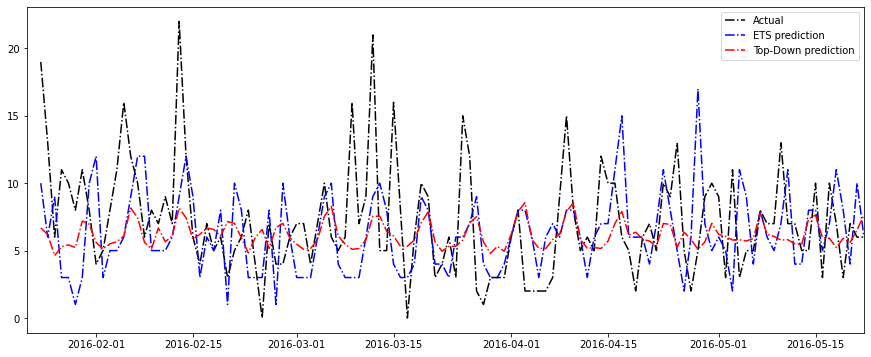

FOODS_1_102
Average sales for foods items is:  7.683333333333334
Root mean squared error is:  5.734399125743981
sales fraction is:  0.00028983138632877696
(top down) Root mean squared error is:  4.1021492344328445
RMSE ratio between (top-down)HTS:(Random Forest)TS =  0.7153581647319729


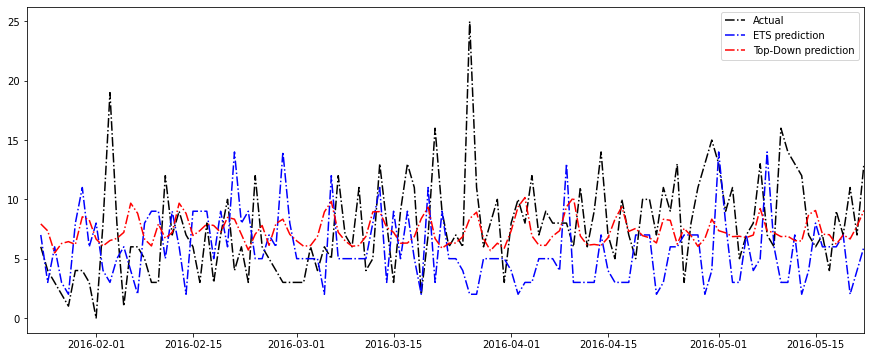

In [217]:
list_of_FOODS_1_items = sales[sales.cat_id == 'FOODS'].item_id[0:100].values

for cat in list_of_FOODS_1_items:
    print(cat)
    topdown_compare_visual(column_to_filter = 'item_id', column_value_to_filter=cat,
                           top_of_chain_sales=FOODS_sales, 
                           prediction_for_top_of_chain_sales=prediction_for_FOODS)

(array([ 6., 23., 32., 19.,  5.,  5.,  5.,  2.,  0.,  3.]),
 array([0.53870515, 0.64853962, 0.75837409, 0.86820856, 0.97804303,
        1.08787751, 1.19771198, 1.30754645, 1.41738092, 1.52721539,
        1.63704986]),
 <BarContainer object of 10 artists>)

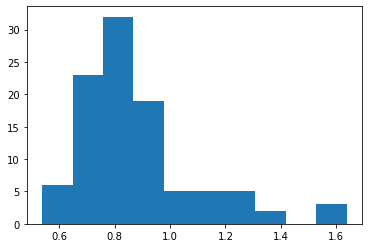

In [220]:
#Put the RMSE ratios in a list, so that we can plot in a histogram 
ratio =[]
for cat in list_of_FOODS_1_items:
    ratio.append(topdown_compare_ratio(column_to_filter='item_id', column_value_to_filter=cat, 
                                       top_of_chain_sales=FOODS_sales,
                                       prediction_for_top_of_chain_sales=prediction_for_FOODS))
plt.hist(ratio)

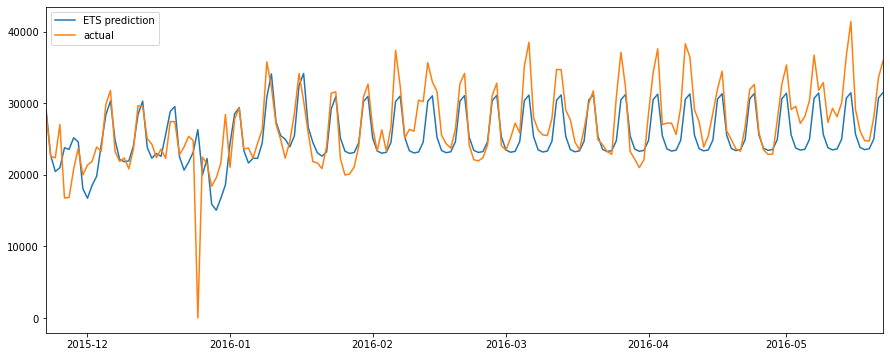

In [33]:
plt.figure(figsize=(15,6))
plt.plot(foods.ETS, label='ETS prediction')
plt.plot(foods.FOODS, label='actual')
plt.xlim('2015-11-22', '2016-05-22')
plt.legend()

Average sales for foods items is:  28314.183333333334
Root mean squared error is:  4134.218426740416


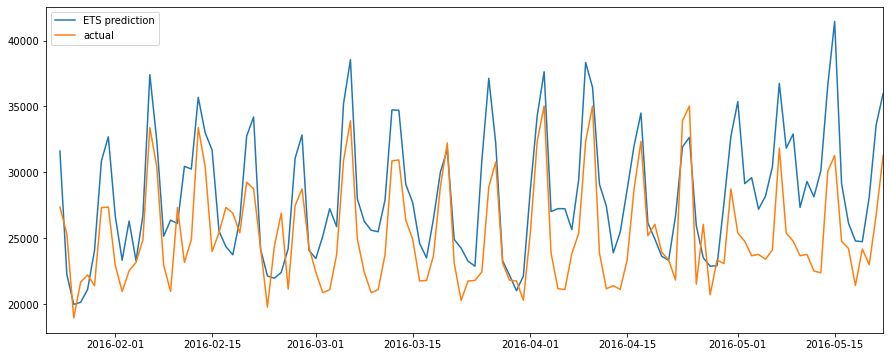

In [38]:
print("Average sales for foods items is: ", foods_y_test.mean())
rmse = sqrt(mean_squared_error(foods_y_test, foods_y_predicted))
print("Root mean squared error is: ", rmse)
plt.figure(figsize=(15,6))
plt.plot(foods_y_test, label='ETS prediction')
plt.plot(foods_y_test.index, foods_y_predicted, label='actual')
plt.xlim('2016-01-22', '2016-05-22')
plt.legend()

Average sales for foods items is:  28314.183333333334
Root mean squared error is:  4137.234799154302


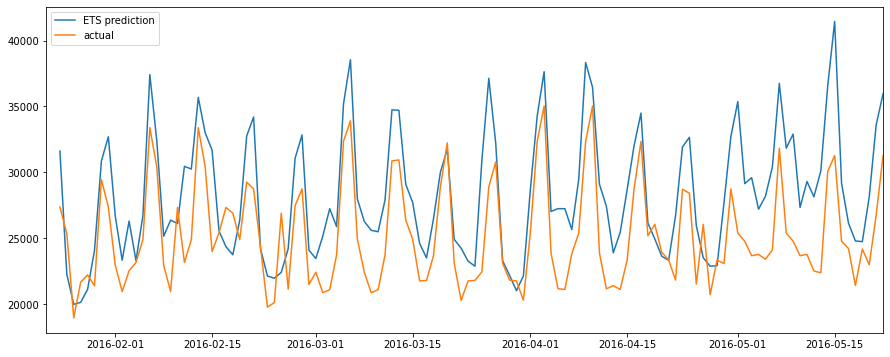

In [77]:
print("Average sales for foods items is: ", foods_y_test.mean())
rmse = sqrt(mean_squared_error(foods_y_test, prediction_for_top_of_chain_sales))
print("Root mean squared error is: ", rmse)
plt.figure(figsize=(15,6))
plt.plot(foods_y_test, label='ETS prediction')
plt.plot(foods_y_test.index, prediction_for_top_of_chain_sales, label='actual')
plt.xlim('2016-01-22', '2016-05-22')
plt.legend()